In [16]:
import os
import torch
import kagglehub
import numpy as np
import polars as pl
import sklearn as sk
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

from dota import Dota2
from heroes import get_heroes
from model import Dota2Autoencoder
from dataset import get_dataset
from leagues import get_tier_one
from mpl_toolkits.mplot3d import Axes3D
from sklearn.cluster import DBSCAN
from itertools import product
from sklearn.cluster import AgglomerativeClustering
from sklearn.mixture import GaussianMixture
from sklearn.cluster import OPTICS

def plot_clustering_grid(latent_space, title, n_clusters=4):
    # Organize plots in a 2x2 grid
    fig, axs = plt.subplots(2, 2, figsize=(10, 8))
    
    # KMeans clustering
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    cluster_labels = kmeans.fit_predict(latent_space)
    for cluster_id in np.unique(cluster_labels):
        mask = cluster_labels == cluster_id
        axs[0, 0].scatter(latent_space[mask, 0], latent_space[mask, 1], 
                       label=f"Cluster {cluster_id}", alpha=0.7)
    axs[0, 0].set_xlabel("Latent X")
    axs[0, 0].set_ylabel("Latent Y")
    axs[0, 0].set_title("KMeans Clustering")
    axs[0, 0].legend()

    # Agglomerative clustering
    agglo = AgglomerativeClustering(n_clusters=n_clusters)
    agglo_labels = agglo.fit_predict(latent_space)
    for cluster_id in np.unique(agglo_labels):
        mask = agglo_labels == cluster_id
        axs[0, 1].scatter(latent_space[mask, 0], latent_space[mask, 1], 
                       label=f"Cluster {cluster_id}", alpha=0.7)
    axs[0, 1].set_xlabel("Latent X")
    axs[0, 1].set_ylabel("Latent Y")
    axs[0, 1].set_title("Agglomerative Clustering")
    axs[0, 1].legend()

    # Gaussian Mixture clustering
    gmm = GaussianMixture(n_components=n_clusters, random_state=42)
    gmm_labels = gmm.fit_predict(latent_space)
    for cluster_id in np.unique(gmm_labels):
        mask = gmm_labels == cluster_id
        axs[1, 0].scatter(latent_space[mask, 0], latent_space[mask, 1], 
                       label=f"Cluster {cluster_id}", alpha=0.7)
    axs[1, 0].set_xlabel("Latent X")
    axs[1, 0].set_ylabel("Latent Y")
    axs[1, 0].set_title("Gaussian Mixture Clustering")
    axs[1, 0].legend()

    # OPTICS clustering
    optics = OPTICS(min_samples=10, xi=0.05, min_cluster_size=0.05)
    optics_labels = optics.fit_predict(latent_space)
    for cluster_id in np.unique(optics_labels):
        mask = optics_labels == cluster_id
        if cluster_id == -1:
            axs[1, 1].scatter(latent_space[mask, 0], latent_space[mask, 1], 
                           label="Ruído", alpha=0.5, c="k")
        else:
            axs[1, 1].scatter(latent_space[mask, 0], latent_space[mask, 1], 
                           label=f"Cluster {cluster_id}", alpha=0.7)
    axs[1, 1].set_xlabel("Latent X")
    axs[1, 1].set_ylabel("Latent Y")
    axs[1, 1].set_title("OPTICS Clustering")
    axs[1, 1].legend()
    
    plt.tight_layout()
    plt.suptitle(f"Clustering de {title}", y=1.02)
    plt.show()
    
    return {
        "kmeans": cluster_labels,
        "agglomerative": agglo_labels,
        "gmm": gmm_labels,
        "optics": optics_labels
    }

In [17]:
def plot_clustering_grid_3d(latent_space, title, n_clusters=4, figsize=(12, 10), alpha=0.7, elev=30, azim=45):
    # Verificar se o espaço latente tem pelo menos 3 dimensões
    if latent_space.shape[1] < 3:
        raise ValueError("O espaço latente precisa ter pelo menos 3 dimensões para visualização 3D")
    
    # Organize plots in a 2x2 grid
    fig = plt.figure(figsize=figsize)
    
    # KMeans clustering
    ax1 = fig.add_subplot(2, 2, 1, projection='3d')
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    cluster_labels = kmeans.fit_predict(latent_space)
    
    for cluster_id in np.unique(cluster_labels):
        mask = cluster_labels == cluster_id
        ax1.scatter(latent_space[mask, 0], latent_space[mask, 1], latent_space[mask, 2],
                   label=f"Cluster {cluster_id}", alpha=alpha)
    
    ax1.set_xlabel("Latent X")
    ax1.set_ylabel("Latent Y")
    ax1.set_zlabel("Latent Z")# type: ignore
    ax1.set_title("KMeans Clustering")
    ax1.legend()
    ax1.view_init(elev=elev, azim=azim)# type: ignore
    
    # Agglomerative clustering
    ax2 = fig.add_subplot(2, 2, 2, projection='3d')
    agglo = AgglomerativeClustering(n_clusters=n_clusters)
    agglo_labels = agglo.fit_predict(latent_space)
    
    for cluster_id in np.unique(agglo_labels):
        mask = agglo_labels == cluster_id
        ax2.scatter(latent_space[mask, 0], latent_space[mask, 1], latent_space[mask, 2],
                   label=f"Cluster {cluster_id}", alpha=alpha)
    
    ax2.set_xlabel("Latent X")
    ax2.set_ylabel("Latent Y")
    ax2.set_zlabel("Latent Z") # type: ignore
    ax2.set_title("Agglomerative Clustering")
    ax2.legend()
    ax2.view_init(elev=elev, azim=azim) # type: ignore
    
    # Gaussian Mixture clustering
    ax3 = fig.add_subplot(2, 2, 3, projection='3d')
    gmm = GaussianMixture(n_components=n_clusters, random_state=42)
    gmm_labels = gmm.fit_predict(latent_space)
    
    for cluster_id in np.unique(gmm_labels):
        mask = gmm_labels == cluster_id
        ax3.scatter(latent_space[mask, 0], latent_space[mask, 1], latent_space[mask, 2],
                   label=f"Cluster {cluster_id}", alpha=alpha)
    
    ax3.set_xlabel("Latent X")
    ax3.set_ylabel("Latent Y")
    ax3.set_zlabel("Latent Z")# type: ignore
    ax3.set_title("Gaussian Mixture Clustering")
    ax3.legend()
    ax3.view_init(elev=elev, azim=azim)# type: ignore
    
    # OPTICS clustering
    ax4 = fig.add_subplot(2, 2, 4, projection='3d')
    optics = OPTICS(min_samples=10, xi=0.05, min_cluster_size=0.05)
    optics_labels = optics.fit_predict(latent_space)
    
    for cluster_id in np.unique(optics_labels):
        mask = optics_labels == cluster_id
        if cluster_id == -1:
            ax4.scatter(latent_space[mask, 0], latent_space[mask, 1], latent_space[mask, 2],
                       label="Ruído", alpha=alpha, c="k")
        else:
            ax4.scatter(latent_space[mask, 0], latent_space[mask, 1], latent_space[mask, 2],
                       label=f"Cluster {cluster_id}", alpha=alpha)
    
    ax4.set_xlabel("Latent X")
    ax4.set_ylabel("Latent Y")
    ax4.set_zlabel("Latent Z")# type: ignore
    ax4.set_title("OPTICS Clustering")
    ax4.legend()
    ax4.view_init(elev=elev, azim=azim)# type: ignore
    
    plt.tight_layout()
    plt.suptitle(f"Clustering 3D de {title}", y=1.02)
    plt.show()
    
    return {
        "kmeans": cluster_labels,
        "agglomerative": agglo_labels,
        "gmm": gmm_labels,
        "optics": optics_labels
    }

In [18]:
import os
import torch
import kagglehub
import numpy as np
import polars as pl
import sklearn as sk
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

from dota import Dota2
from heroes import get_heroes
from model import Dota2Autoencoder
from dataset import get_dataset
from leagues import get_tier_one
from mpl_toolkits.mplot3d import Axes3D
from sklearn.cluster import DBSCAN
from itertools import product
from sklearn.cluster import AgglomerativeClustering
from sklearn.mixture import GaussianMixture
from sklearn.cluster import OPTICS

path = kagglehub.dataset_download("bwandowando/dota-2-pro-league-matches-2023")
heroes, hero_cols, dict_attributes, dict_roles = get_heroes(path)
tier_one_matches = get_tier_one(path)
n_heroes = len(heroes.collect())
player_cols = []
hero_cols = []

def cluster(datasets: list[pl.DataFrame], internationals: list[pl.DataFrame], hero_cols, player_cols, latent_dim=2, n_clusters=6):
    hero_pick_embedding_dim: int = 16
    hero_role_embedding_dim: int = 8
    n_players: int = 5
    n_bans: int = 7
    # latent_dim: int = 8
    hidden_layers: list[int] = [256, 128, 64, 32]
    dropout: float = 0.3
    learning_rate: float = 0.001
    force: bool = False

    autoencoders: list[Dota2Autoencoder] = []

    for ti, dataset in enumerate(datasets):
        autoencoder = Dota2Autoencoder(
            dict_roles=dict_roles,
            hero_cols=hero_cols[ti],
            player_cols=player_cols[ti],
            n_heroes=n_heroes,
            hero_pick_embedding_dim=hero_pick_embedding_dim,
            hero_role_embedding_dim=hero_role_embedding_dim,
            n_players=n_players,
            n_bans=n_bans,
            latent_dim=latent_dim,
            hidden_layers=hidden_layers,
            dropout=dropout,
            learning_rate=learning_rate,
            name=f"ti_{2024 - ti}_{latent_dim}_autoencoder",
        )
        if (os.path.exists(f"ti_{2024 - ti}_{latent_dim}_best_model.h5") and force == False):
            print(f"Loading pre-trained model for TI {2024 - ti}")
            autoencoder.load_model(f"ti_{2024 - ti}_{latent_dim}_autoencoder.h5", silent=True)
        else:
            print(f"Treinando para TI {2024 - ti} Latent Dim: {latent_dim}")
            train_df, val_df, test_df = dataset.sample(fraction=0.7, seed=42), dataset.sample(
                fraction=0.15, seed=42), dataset.sample(fraction=0.15, seed=42)
            autoencoder.train_data(train_df, val_df, epochs=100, patience=20,
                                best_model_filename=f"ti_{2024 - ti}_{latent_dim}_best_model.h5", silent=True)
            autoencoder.save_loss_history(
                f"ti_{2024 - ti}_{latent_dim}_loss_history.csv", silent=True)
            autoencoder.save_model(f"ti_{2024 - ti}_{latent_dim}_autoencoder.h5", silent=True)
            accuracy, mse, _, _ = autoencoder.test_model(test_df)
            print(
                f"TI {2024 - ti} - Accuracy: {accuracy}, MSE: {mse}, Loss: {autoencoder.best_val_loss}")
            print("=" * 50)
        autoencoders.append(autoencoder)

    latent_spaces = []
    for autoencoder, ti_matches in product(autoencoders, internationals):
        ti = ti_matches.select('league_name').unique().item()
        print(f"Processing {ti_matches.shape[0]} matches from {ti}")
        print(f"Autoencoder name: {autoencoder.name}")
        autoencoder.eval()
        encoded = []
        total_similarity = 0
        matches_encoded = []
        autoencoder.eval()
        with torch.no_grad():
            for batch in ti_matches.iter_slices(32):
                data_np = batch.to_numpy()
                try:
                    matches_encoded.append(batch.select("match_id").to_numpy())
                    latent, reconstructed = autoencoder.encode(
                        data_np, min(32, batch.shape[0]), ti_matches.columns)
                    similarity = torch.cosine_similarity(autoencoder.flatten(
                        data_np, min(32, batch.shape[0]), ti_matches.columns), reconstructed)
                    total_similarity += similarity.sum().item()
                    encoded.append(latent.cpu().numpy())
                except RuntimeError as e:
                    print(f"RuntimeError: {e}")
                    print("Check if the input shape matches the model's expected input size.")
                    print(f"Expected input size: {autoencoder.input_dim if hasattr(autoencoder, 'input_dim') else 'unknown'}")
                    print(f"Actual input size: {data_np.shape[1]}")
                    raise

        latent_space = np.concatenate(encoded, axis=0)
        latent_spaces.append((ti, ti_matches, latent_space, matches_encoded, autoencoder.name))
        if(latent_dim == 2):
            cluster_results = plot_clustering_grid(latent_space, f"{ti}  {autoencoder.name.upper()}", n_clusters=n_clusters)
        if(latent_dim == 3):
            cluster_results = plot_clustering_grid_3d(
                latent_space, 
                f"{ti} - {autoencoder.name.upper()}",
                n_clusters=n_clusters,
                elev=30,  # Ajuste a elevação para melhor visualização
                azim=120   # Ajuste o ângulo de visualização
            )
        else:
            kmeans = KMeans(n_clusters=n_clusters, random_state=42)
            cluster_labels = kmeans.fit_predict(latent_space)

            agglo = AgglomerativeClustering(n_clusters=n_clusters)
            agglo_labels = agglo.fit_predict(latent_space)

            gmm = GaussianMixture(n_components=n_clusters, random_state=42)
            gmm_labels = gmm.fit_predict(latent_space)

            optics = OPTICS(min_samples=10, xi=0.05, min_cluster_size=0.05)
            optics_labels = optics.fit_predict(latent_space)
            cluster_results = {
                "kmeans": cluster_labels,
                "agglomerative": agglo_labels,
                "gmm": gmm_labels,
                "optics": optics_labels
            }
        print("="*50)
        print(f"Cluster labels: {np.unique(cluster_results['kmeans'])}")
        print(f"Agglomerative labels: {np.unique(cluster_results['agglomerative'])}")
        print(f"GMM labels: {np.unique(cluster_results['gmm'])}")
        print(f"OPTICS labels: {np.unique(cluster_results['optics'])}")
        for algo, labels in cluster_results.items():
            unique, counts = np.unique(labels, return_counts=True)
            print(f"Algoritmo: {algo}")
            for cluster_id, count in zip(unique, counts):
                print(f"  Cluster {cluster_id}: {count} partidas")
        print("="*50)

In [19]:
import os
import torch
import kagglehub
import numpy as np
import polars as pl
import sklearn as sk
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

from dota import Dota2
from heroes import get_heroes
from model import Dota2Autoencoder
from dataset import get_dataset
from leagues import get_tier_one
from mpl_toolkits.mplot3d import Axes3D
from sklearn.cluster import DBSCAN
from itertools import product
from sklearn.cluster import AgglomerativeClustering
from sklearn.mixture import GaussianMixture
from sklearn.cluster import OPTICS

heroes, _, dict_attributes, dict_roles = get_heroes(path)
tier_one_matches = get_tier_one(path)
n_heroes = len(heroes.collect())
player_cols = []
hero_cols = []

print(f"Carregando dados de torneios...")
ti_2024, p_cols, h_cols = get_dataset(path, specific_patches=[56], verbose=False)
player_cols.append(p_cols)
hero_cols.append(h_cols)
ti_2023, p_cols, h_cols = get_dataset(path, specific_patches=[53], verbose=False)
player_cols.append(p_cols)
hero_cols.append(h_cols)
ti_2022, p_cols, h_cols = get_dataset(path, specific_patches=[51], verbose=False)
player_cols.append(p_cols)
hero_cols.append(h_cols)
ti_2021, p_cols, h_cols = get_dataset(path, specific_patches=[49, 48], verbose=False)
player_cols.append(p_cols)
hero_cols.append(h_cols)

print(f"Carregando dados de torneios concluído.")
matches_ti_2024 = ti_2024.join(tier_one_matches, on="league_id", how="left").filter(
    pl.col("league_name") == "The International 2024")
matches_ti_2023 = ti_2023.join(tier_one_matches, on="league_id", how="left").filter(
    pl.col("league_name") == "The International 2023")
matches_ti_2022 = ti_2022.join(tier_one_matches, on="league_id", how="left").filter(
    pl.col("league_name") == "The International 2022")
matches_ti_2021 = ti_2021.join(tier_one_matches, on="league_id", how="left").filter(
    pl.col("league_name") == "The International 2021")
internationals = [matches_ti_2024, matches_ti_2023,
                  matches_ti_2022, matches_ti_2021]
datasets = [ti_2024, ti_2023, ti_2022, ti_2021]


Carregando dados de torneios...
Carregando dados de torneios concluído.
Carregando dados de torneios concluído.


Cluster de datasets usando 2 dimensões latentes:
Loading pre-trained model for TI 2024
Loading pre-trained model for TI 2023
Loading pre-trained model for TI 2022
Loading pre-trained model for TI 2021
Processing 97 matches from The International 2024
Autoencoder name: ti_2024_2_autoencoder
Loading pre-trained model for TI 2023
Loading pre-trained model for TI 2022
Loading pre-trained model for TI 2021
Processing 97 matches from The International 2024
Autoencoder name: ti_2024_2_autoencoder


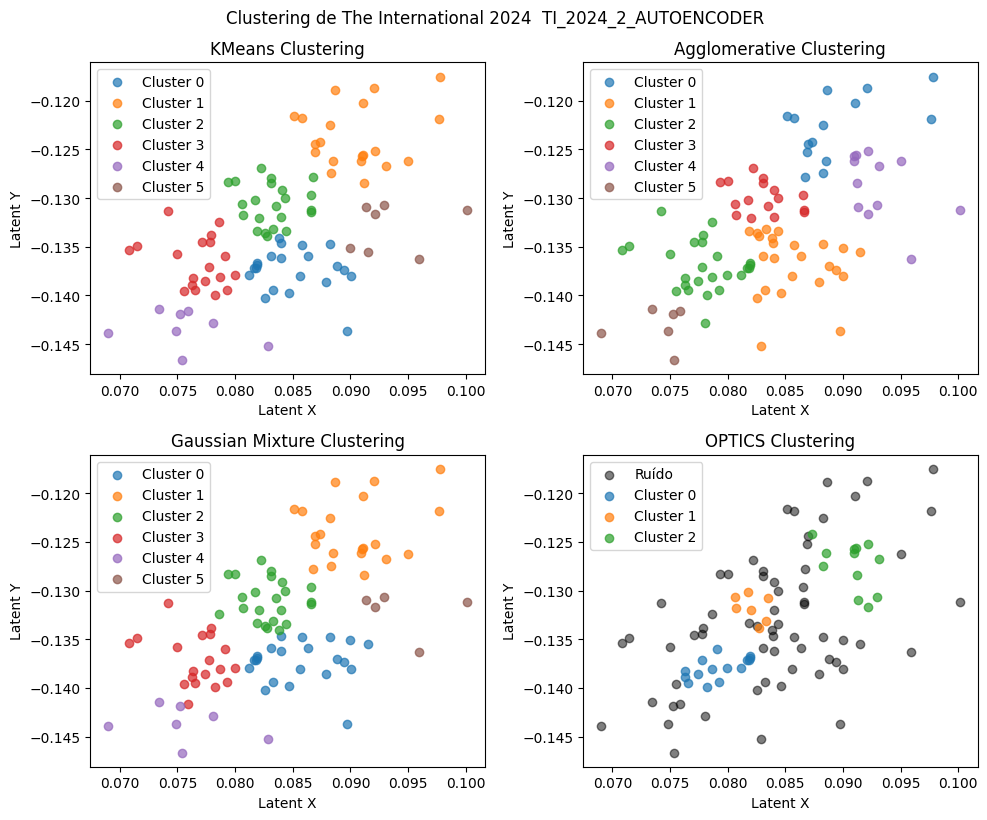

Cluster labels: [0 1 2 3 4 5]
Agglomerative labels: [0 1 2 3 4 5]
GMM labels: [0 1 2 3 4 5]
OPTICS labels: [-1  0  1  2]
Algoritmo: kmeans
  Cluster 0: 21 partidas
  Cluster 1: 20 partidas
  Cluster 2: 22 partidas
  Cluster 3: 19 partidas
  Cluster 4: 8 partidas
  Cluster 5: 7 partidas
Algoritmo: agglomerative
  Cluster 0: 14 partidas
  Cluster 1: 24 partidas
  Cluster 2: 25 partidas
  Cluster 3: 16 partidas
  Cluster 4: 12 partidas
  Cluster 5: 6 partidas
Algoritmo: gmm
  Cluster 0: 22 partidas
  Cluster 1: 21 partidas
  Cluster 2: 23 partidas
  Cluster 3: 19 partidas
  Cluster 4: 7 partidas
  Cluster 5: 5 partidas
Algoritmo: optics
  Cluster -1: 63 partidas
  Cluster 0: 15 partidas
  Cluster 1: 7 partidas
  Cluster 2: 12 partidas
Processing 132 matches from The International 2023
Autoencoder name: ti_2024_2_autoencoder


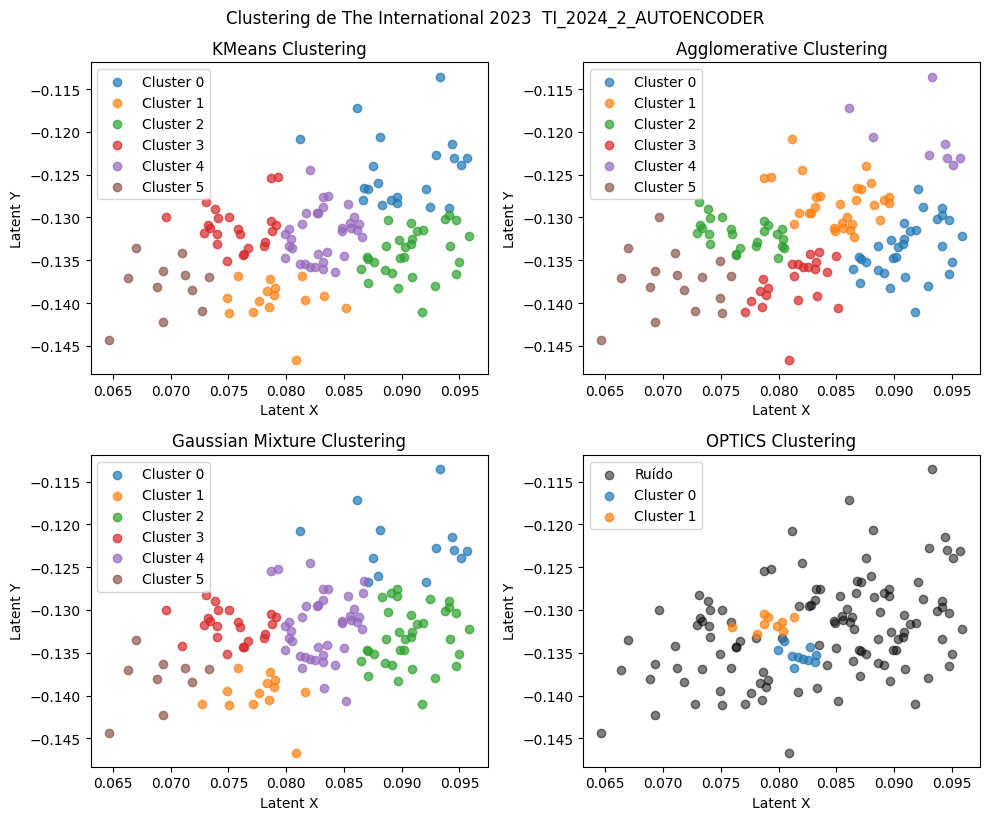

Cluster labels: [0 1 2 3 4 5]
Agglomerative labels: [0 1 2 3 4 5]
GMM labels: [0 1 2 3 4 5]
OPTICS labels: [-1  0  1]
Algoritmo: kmeans
  Cluster 0: 21 partidas
  Cluster 1: 15 partidas
  Cluster 2: 29 partidas
  Cluster 3: 23 partidas
  Cluster 4: 33 partidas
  Cluster 5: 11 partidas
Algoritmo: agglomerative
  Cluster 0: 31 partidas
  Cluster 1: 30 partidas
  Cluster 2: 25 partidas
  Cluster 3: 22 partidas
  Cluster 4: 8 partidas
  Cluster 5: 16 partidas
Algoritmo: gmm
  Cluster 0: 13 partidas
  Cluster 1: 13 partidas
  Cluster 2: 35 partidas
  Cluster 3: 22 partidas
  Cluster 4: 40 partidas
  Cluster 5: 9 partidas
Algoritmo: optics
  Cluster -1: 113 partidas
  Cluster 0: 10 partidas
  Cluster 1: 9 partidas
Processing 195 matches from The International 2022
Autoencoder name: ti_2024_2_autoencoder


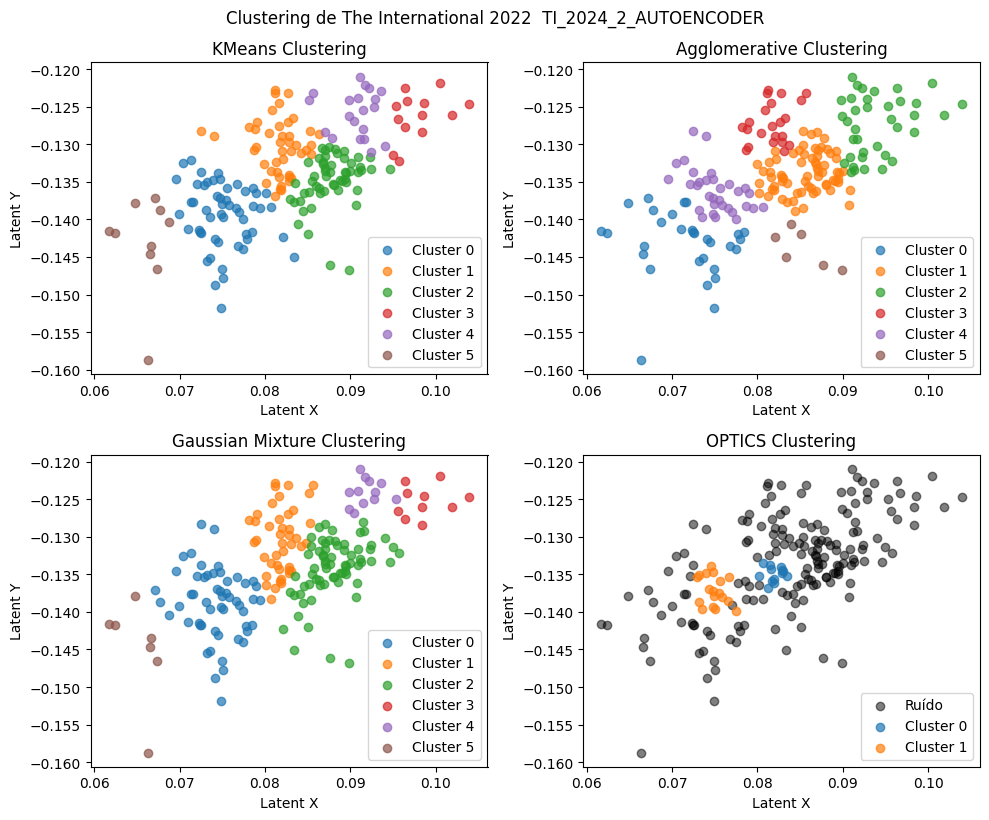

Cluster labels: [0 1 2 3 4 5]
Agglomerative labels: [0 1 2 3 4 5]
GMM labels: [0 1 2 3 4 5]
OPTICS labels: [-1  0  1]
Algoritmo: kmeans
  Cluster 0: 53 partidas
  Cluster 1: 44 partidas
  Cluster 2: 55 partidas
  Cluster 3: 13 partidas
  Cluster 4: 20 partidas
  Cluster 5: 10 partidas
Algoritmo: agglomerative
  Cluster 0: 30 partidas
  Cluster 1: 68 partidas
  Cluster 2: 37 partidas
  Cluster 3: 22 partidas
  Cluster 4: 32 partidas
  Cluster 5: 6 partidas
Algoritmo: gmm
  Cluster 0: 54 partidas
  Cluster 1: 43 partidas
  Cluster 2: 69 partidas
  Cluster 3: 10 partidas
  Cluster 4: 12 partidas
  Cluster 5: 7 partidas
Algoritmo: optics
  Cluster -1: 164 partidas
  Cluster 0: 13 partidas
  Cluster 1: 18 partidas
Processing 758 matches from The International 2021
Autoencoder name: ti_2024_2_autoencoder


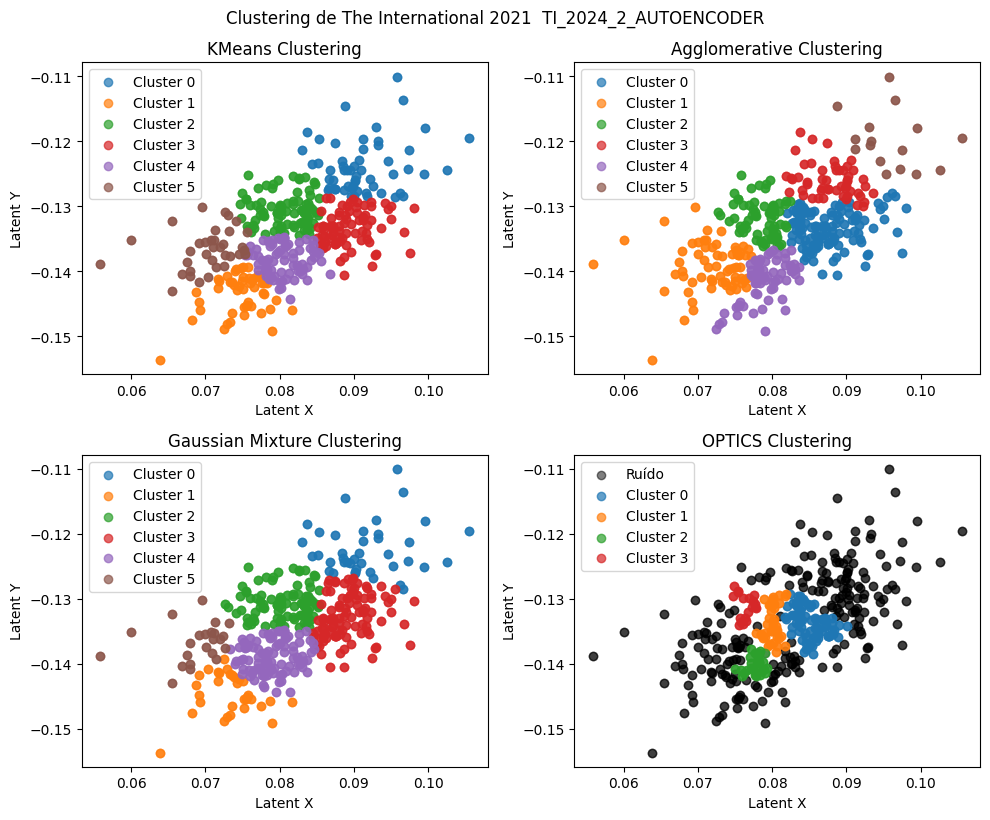

Cluster labels: [0 1 2 3 4 5]
Agglomerative labels: [0 1 2 3 4 5]
GMM labels: [0 1 2 3 4 5]
OPTICS labels: [-1  0  1  2  3]
Algoritmo: kmeans
  Cluster 0: 110 partidas
  Cluster 1: 98 partidas
  Cluster 2: 172 partidas
  Cluster 3: 154 partidas
  Cluster 4: 154 partidas
  Cluster 5: 70 partidas
Algoritmo: agglomerative
  Cluster 0: 226 partidas
  Cluster 1: 130 partidas
  Cluster 2: 134 partidas
  Cluster 3: 104 partidas
  Cluster 4: 132 partidas
  Cluster 5: 32 partidas
Algoritmo: gmm
  Cluster 0: 80 partidas
  Cluster 1: 64 partidas
  Cluster 2: 180 partidas
  Cluster 3: 196 partidas
  Cluster 4: 192 partidas
  Cluster 5: 46 partidas
Algoritmo: optics
  Cluster -1: 441 partidas
  Cluster 0: 144 partidas
  Cluster 1: 78 partidas
  Cluster 2: 57 partidas
  Cluster 3: 38 partidas
Processing 97 matches from The International 2024
Autoencoder name: ti_2023_2_autoencoder


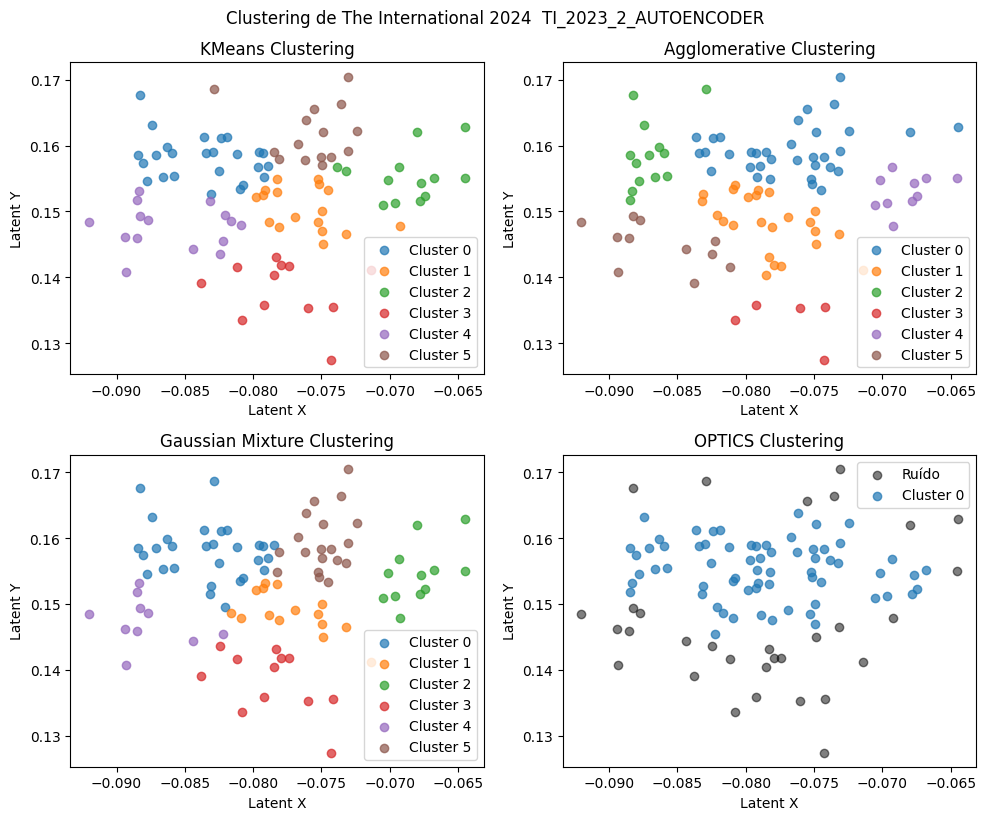

Cluster labels: [0 1 2 3 4 5]
Agglomerative labels: [0 1 2 3 4 5]
GMM labels: [0 1 2 3 4 5]
OPTICS labels: [-1  0]
Algoritmo: kmeans
  Cluster 0: 25 partidas
  Cluster 1: 17 partidas
  Cluster 2: 13 partidas
  Cluster 3: 12 partidas
  Cluster 4: 15 partidas
  Cluster 5: 15 partidas
Algoritmo: agglomerative
  Cluster 0: 34 partidas
  Cluster 1: 24 partidas
  Cluster 2: 13 partidas
  Cluster 3: 5 partidas
  Cluster 4: 10 partidas
  Cluster 5: 11 partidas
Algoritmo: gmm
  Cluster 0: 29 partidas
  Cluster 1: 15 partidas
  Cluster 2: 12 partidas
  Cluster 3: 12 partidas
  Cluster 4: 10 partidas
  Cluster 5: 19 partidas
Algoritmo: optics
  Cluster -1: 31 partidas
  Cluster 0: 66 partidas
Processing 132 matches from The International 2023
Autoencoder name: ti_2023_2_autoencoder


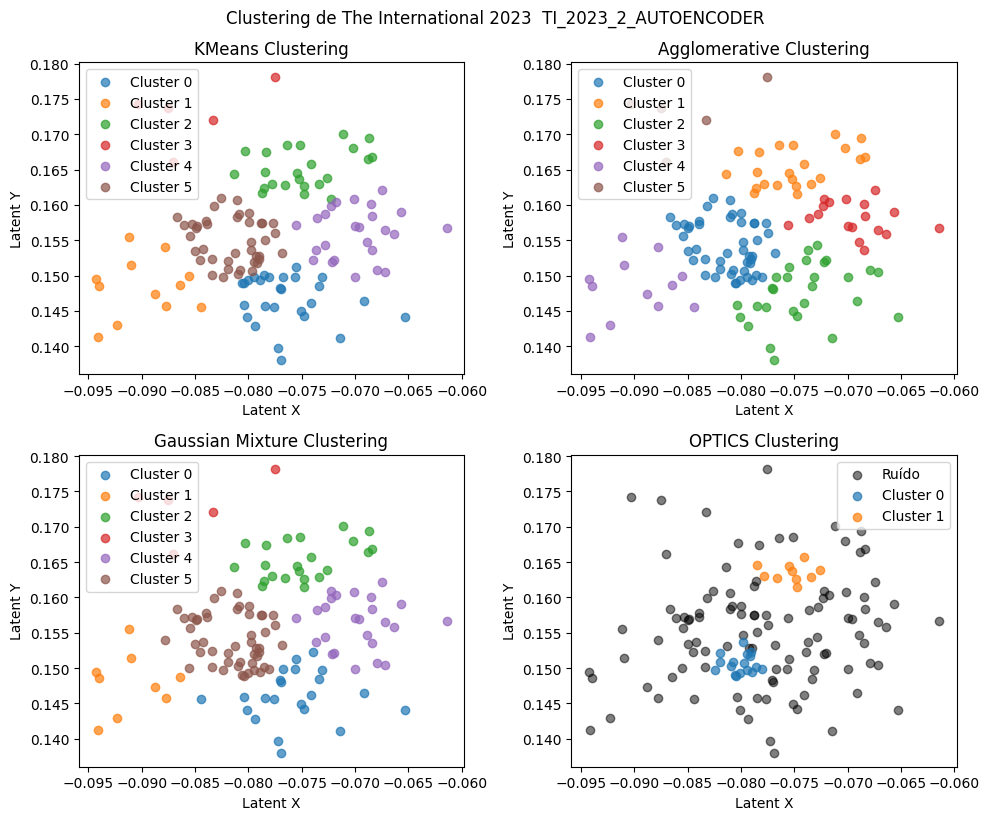

Cluster labels: [0 1 2 3 4 5]
Agglomerative labels: [0 1 2 3 4 5]
GMM labels: [0 1 2 3 4 5]
OPTICS labels: [-1  0  1]
Algoritmo: kmeans
  Cluster 0: 27 partidas
  Cluster 1: 12 partidas
  Cluster 2: 23 partidas
  Cluster 3: 5 partidas
  Cluster 4: 25 partidas
  Cluster 5: 40 partidas
Algoritmo: agglomerative
  Cluster 0: 47 partidas
  Cluster 1: 22 partidas
  Cluster 2: 28 partidas
  Cluster 3: 18 partidas
  Cluster 4: 12 partidas
  Cluster 5: 5 partidas
Algoritmo: gmm
  Cluster 0: 22 partidas
  Cluster 1: 9 partidas
  Cluster 2: 22 partidas
  Cluster 3: 5 partidas
  Cluster 4: 25 partidas
  Cluster 5: 49 partidas
Algoritmo: optics
  Cluster -1: 105 partidas
  Cluster 0: 17 partidas
  Cluster 1: 10 partidas
Processing 195 matches from The International 2022
Autoencoder name: ti_2023_2_autoencoder


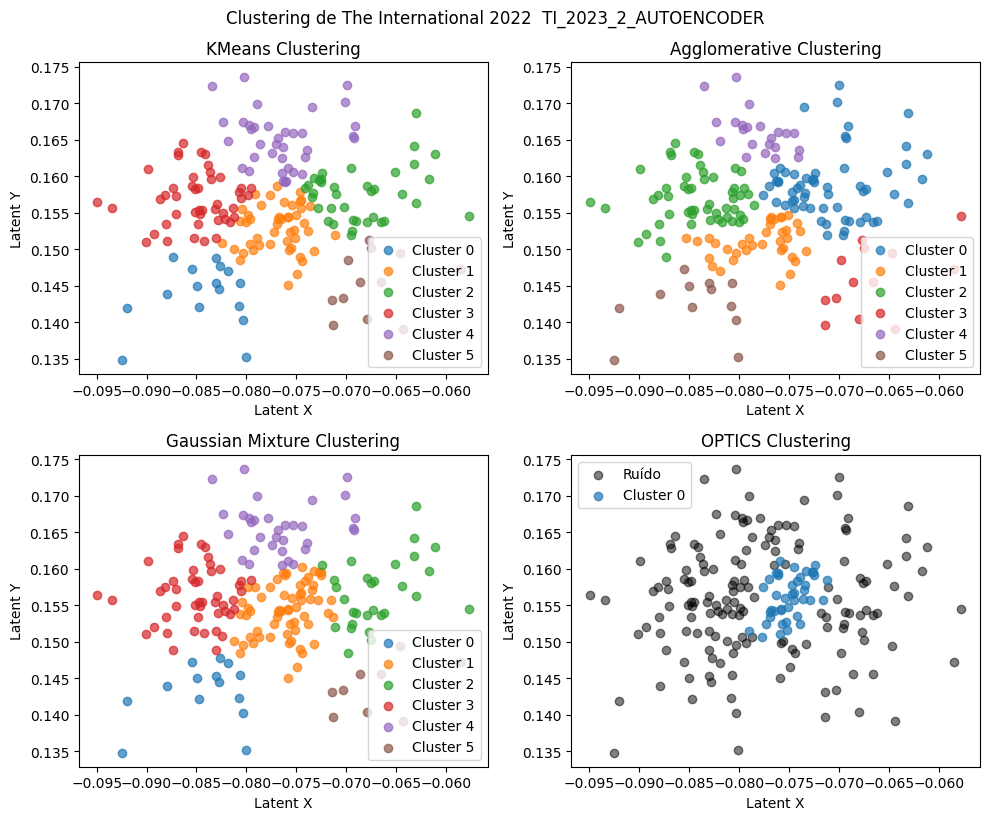

Cluster labels: [0 1 2 3 4 5]
Agglomerative labels: [0 1 2 3 4 5]
GMM labels: [0 1 2 3 4 5]
OPTICS labels: [-1  0]
Algoritmo: kmeans
  Cluster 0: 16 partidas
  Cluster 1: 47 partidas
  Cluster 2: 37 partidas
  Cluster 3: 46 partidas
  Cluster 4: 37 partidas
  Cluster 5: 12 partidas
Algoritmo: agglomerative
  Cluster 0: 59 partidas
  Cluster 1: 36 partidas
  Cluster 2: 53 partidas
  Cluster 3: 13 partidas
  Cluster 4: 22 partidas
  Cluster 5: 12 partidas
Algoritmo: gmm
  Cluster 0: 14 partidas
  Cluster 1: 62 partidas
  Cluster 2: 29 partidas
  Cluster 3: 48 partidas
  Cluster 4: 33 partidas
  Cluster 5: 9 partidas
Algoritmo: optics
  Cluster -1: 153 partidas
  Cluster 0: 42 partidas
Processing 758 matches from The International 2021
Autoencoder name: ti_2023_2_autoencoder


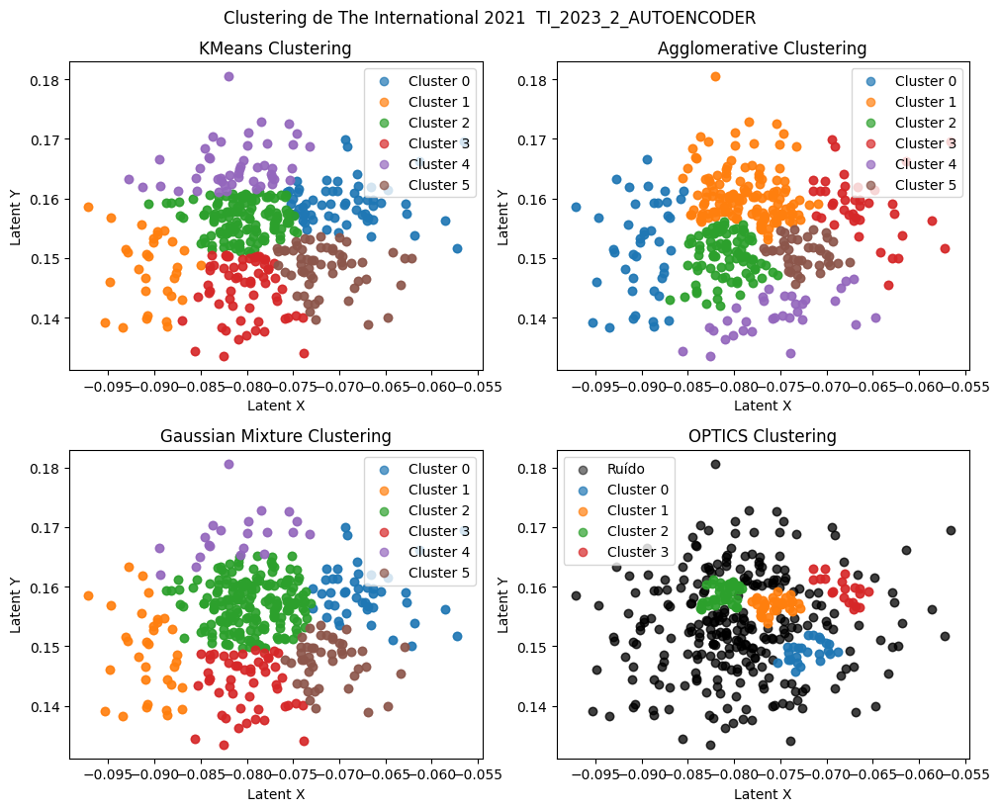

Cluster labels: [0 1 2 3 4 5]
Agglomerative labels: [0 1 2 3 4 5]
GMM labels: [0 1 2 3 4 5]
OPTICS labels: [-1  0  1  2  3]
Algoritmo: kmeans
  Cluster 0: 120 partidas
  Cluster 1: 62 partidas
  Cluster 2: 244 partidas
  Cluster 3: 124 partidas
  Cluster 4: 94 partidas
  Cluster 5: 114 partidas
Algoritmo: agglomerative
  Cluster 0: 86 partidas
  Cluster 1: 268 partidas
  Cluster 2: 176 partidas
  Cluster 3: 80 partidas
  Cluster 4: 64 partidas
  Cluster 5: 84 partidas
Algoritmo: gmm
  Cluster 0: 90 partidas
  Cluster 1: 66 partidas
  Cluster 2: 368 partidas
  Cluster 3: 102 partidas
  Cluster 4: 42 partidas
  Cluster 5: 90 partidas
Algoritmo: optics
  Cluster -1: 537 partidas
  Cluster 0: 48 partidas
  Cluster 1: 63 partidas
  Cluster 2: 70 partidas
  Cluster 3: 40 partidas
Processing 97 matches from The International 2024
Autoencoder name: ti_2022_2_autoencoder


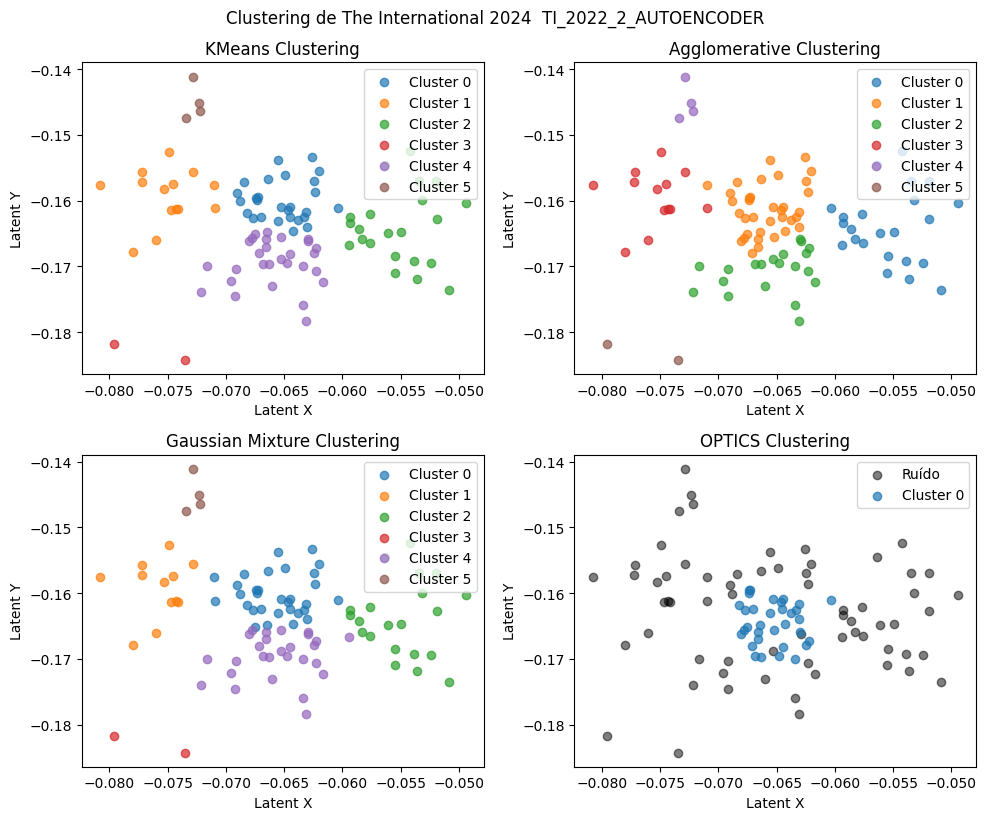

Cluster labels: [0 1 2 3 4 5]
Agglomerative labels: [0 1 2 3 4 5]
GMM labels: [0 1 2 3 4 5]
OPTICS labels: [-1  0]
Algoritmo: kmeans
  Cluster 0: 27 partidas
  Cluster 1: 14 partidas
  Cluster 2: 22 partidas
  Cluster 3: 2 partidas
  Cluster 4: 28 partidas
  Cluster 5: 4 partidas
Algoritmo: agglomerative
  Cluster 0: 23 partidas
  Cluster 1: 35 partidas
  Cluster 2: 20 partidas
  Cluster 3: 13 partidas
  Cluster 4: 4 partidas
  Cluster 5: 2 partidas
Algoritmo: gmm
  Cluster 0: 31 partidas
  Cluster 1: 12 partidas
  Cluster 2: 21 partidas
  Cluster 3: 2 partidas
  Cluster 4: 27 partidas
  Cluster 5: 4 partidas
Algoritmo: optics
  Cluster -1: 64 partidas
  Cluster 0: 33 partidas
Processing 132 matches from The International 2023
Autoencoder name: ti_2022_2_autoencoder


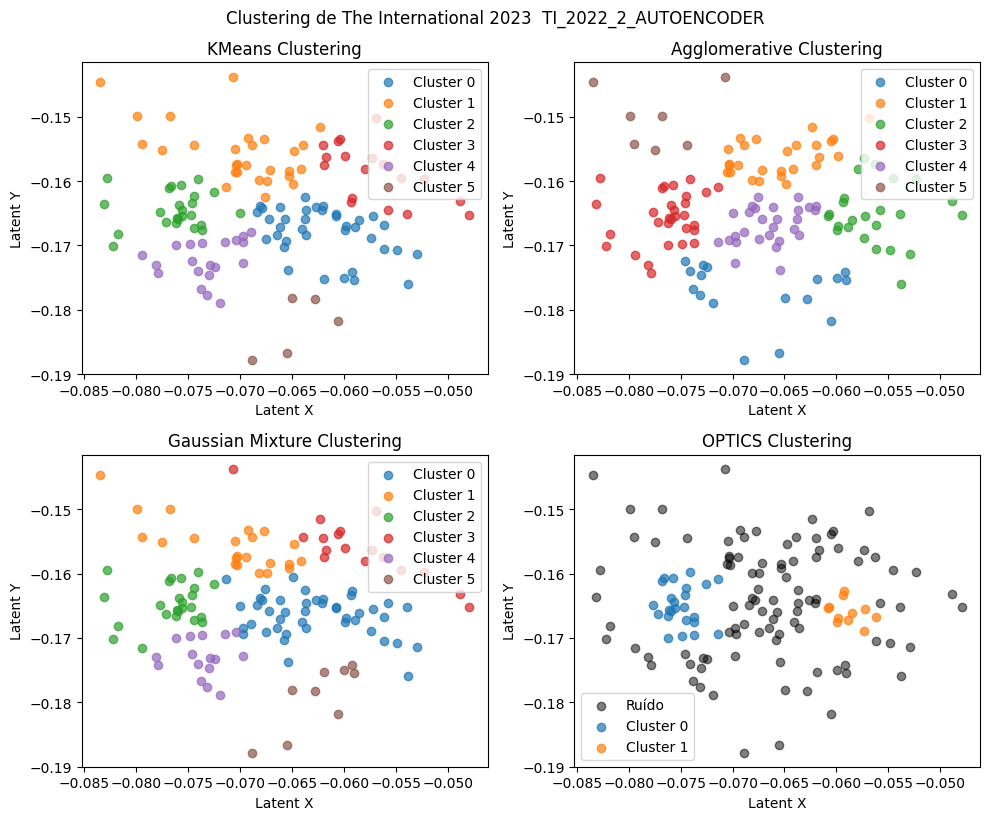

Cluster labels: [0 1 2 3 4 5]
Agglomerative labels: [0 1 2 3 4 5]
GMM labels: [0 1 2 3 4 5]
OPTICS labels: [-1  0  1]
Algoritmo: kmeans
  Cluster 0: 37 partidas
  Cluster 1: 28 partidas
  Cluster 2: 24 partidas
  Cluster 3: 18 partidas
  Cluster 4: 20 partidas
  Cluster 5: 5 partidas
Algoritmo: agglomerative
  Cluster 0: 17 partidas
  Cluster 1: 26 partidas
  Cluster 2: 24 partidas
  Cluster 3: 30 partidas
  Cluster 4: 28 partidas
  Cluster 5: 7 partidas
Algoritmo: gmm
  Cluster 0: 44 partidas
  Cluster 1: 22 partidas
  Cluster 2: 24 partidas
  Cluster 3: 17 partidas
  Cluster 4: 16 partidas
  Cluster 5: 9 partidas
Algoritmo: optics
  Cluster -1: 97 partidas
  Cluster 0: 24 partidas
  Cluster 1: 11 partidas
Processing 195 matches from The International 2022
Autoencoder name: ti_2022_2_autoencoder


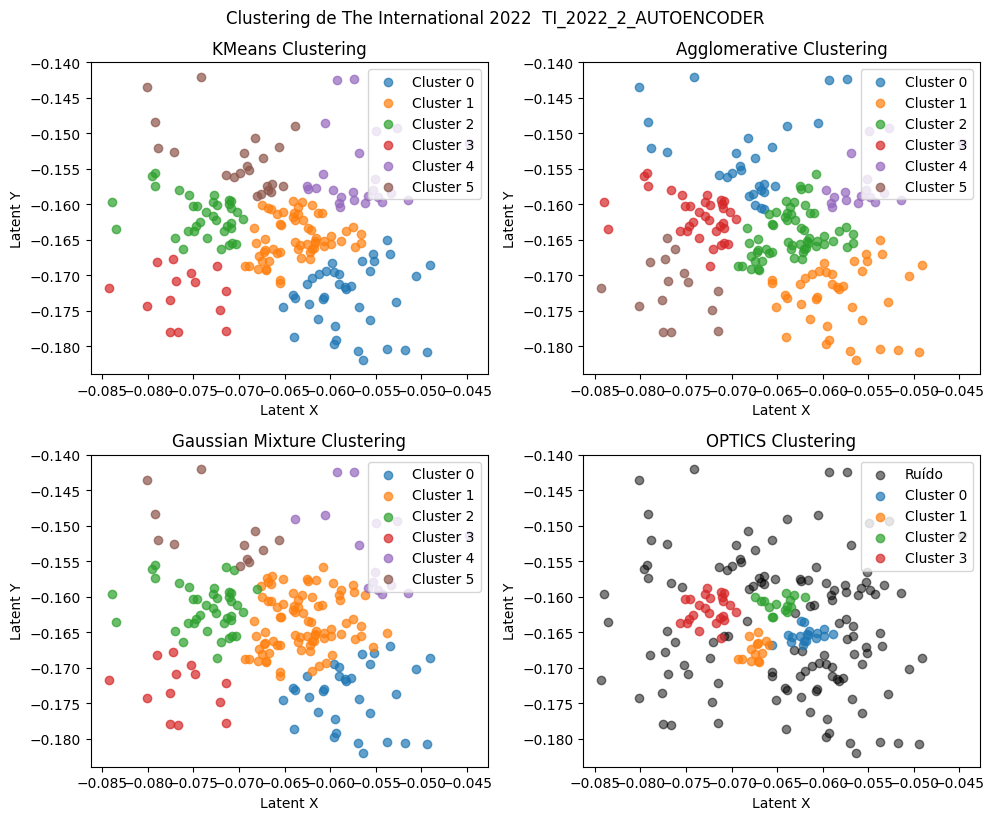

Cluster labels: [0 1 2 3 4 5]
Agglomerative labels: [0 1 2 3 4 5]
GMM labels: [0 1 2 3 4 5]
OPTICS labels: [-1  0  1  2  3]
Algoritmo: kmeans
  Cluster 0: 38 partidas
  Cluster 1: 60 partidas
  Cluster 2: 36 partidas
  Cluster 3: 14 partidas
  Cluster 4: 25 partidas
  Cluster 5: 22 partidas
Algoritmo: agglomerative
  Cluster 0: 28 partidas
  Cluster 1: 40 partidas
  Cluster 2: 59 partidas
  Cluster 3: 35 partidas
  Cluster 4: 18 partidas
  Cluster 5: 15 partidas
Algoritmo: gmm
  Cluster 0: 32 partidas
  Cluster 1: 83 partidas
  Cluster 2: 40 partidas
  Cluster 3: 13 partidas
  Cluster 4: 15 partidas
  Cluster 5: 12 partidas
Algoritmo: optics
  Cluster -1: 124 partidas
  Cluster 0: 18 partidas
  Cluster 1: 14 partidas
  Cluster 2: 15 partidas
  Cluster 3: 24 partidas
Processing 758 matches from The International 2021
Autoencoder name: ti_2022_2_autoencoder


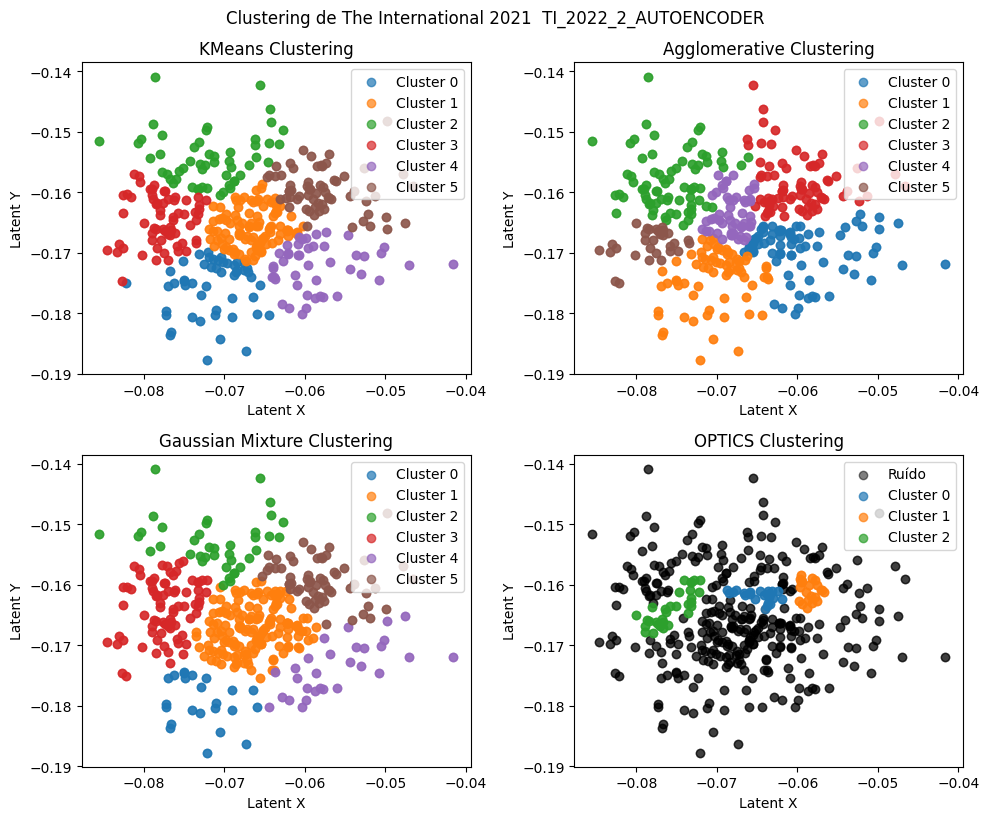

Cluster labels: [0 1 2 3 4 5]
Agglomerative labels: [0 1 2 3 4 5]
GMM labels: [0 1 2 3 4 5]
OPTICS labels: [-1  0  1  2]
Algoritmo: kmeans
  Cluster 0: 100 partidas
  Cluster 1: 206 partidas
  Cluster 2: 106 partidas
  Cluster 3: 128 partidas
  Cluster 4: 90 partidas
  Cluster 5: 128 partidas
Algoritmo: agglomerative
  Cluster 0: 154 partidas
  Cluster 1: 140 partidas
  Cluster 2: 146 partidas
  Cluster 3: 156 partidas
  Cluster 4: 102 partidas
  Cluster 5: 60 partidas
Algoritmo: gmm
  Cluster 0: 46 partidas
  Cluster 1: 300 partidas
  Cluster 2: 78 partidas
  Cluster 3: 154 partidas
  Cluster 4: 58 partidas
  Cluster 5: 122 partidas
Algoritmo: optics
  Cluster -1: 609 partidas
  Cluster 0: 45 partidas
  Cluster 1: 42 partidas
  Cluster 2: 62 partidas
Processing 97 matches from The International 2024
Autoencoder name: ti_2021_2_autoencoder


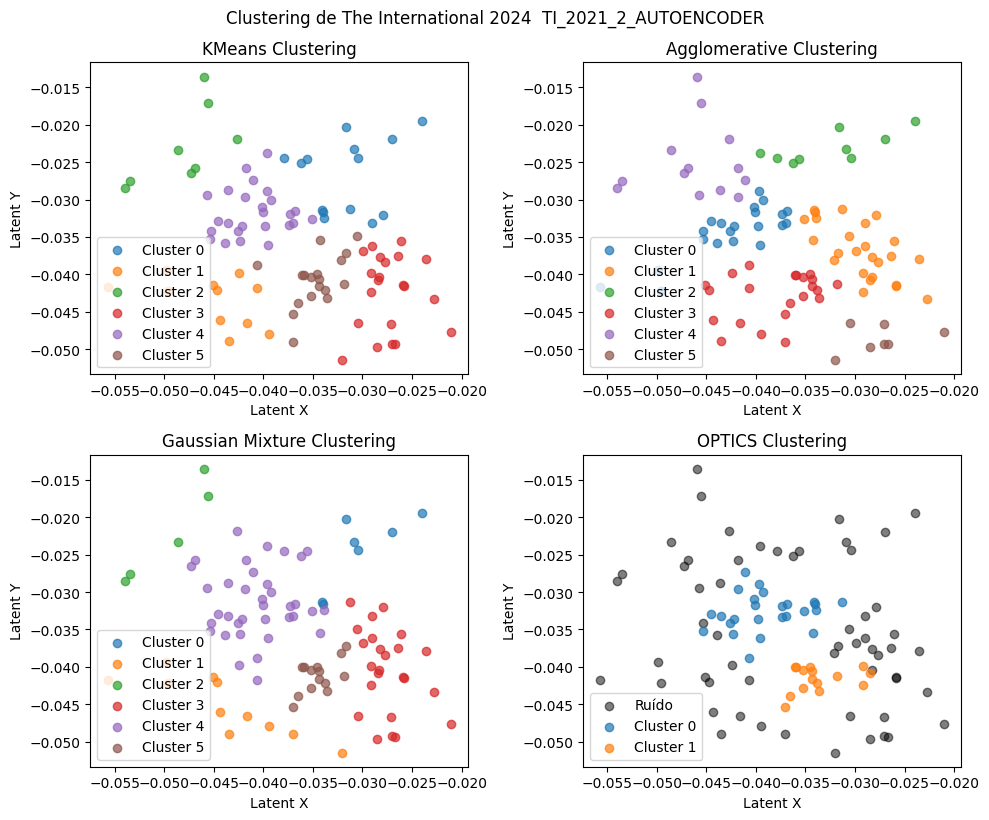

Cluster labels: [0 1 2 3 4 5]
Agglomerative labels: [0 1 2 3 4 5]
GMM labels: [0 1 2 3 4 5]
OPTICS labels: [-1  0  1]
Algoritmo: kmeans
  Cluster 0: 14 partidas
  Cluster 1: 11 partidas
  Cluster 2: 8 partidas
  Cluster 3: 21 partidas
  Cluster 4: 25 partidas
  Cluster 5: 18 partidas
Algoritmo: agglomerative
  Cluster 0: 21 partidas
  Cluster 1: 25 partidas
  Cluster 2: 9 partidas
  Cluster 3: 22 partidas
  Cluster 4: 13 partidas
  Cluster 5: 7 partidas
Algoritmo: gmm
  Cluster 0: 7 partidas
  Cluster 1: 11 partidas
  Cluster 2: 5 partidas
  Cluster 3: 24 partidas
  Cluster 4: 36 partidas
  Cluster 5: 14 partidas
Algoritmo: optics
  Cluster -1: 57 partidas
  Cluster 0: 25 partidas
  Cluster 1: 15 partidas
Processing 132 matches from The International 2023
Autoencoder name: ti_2021_2_autoencoder


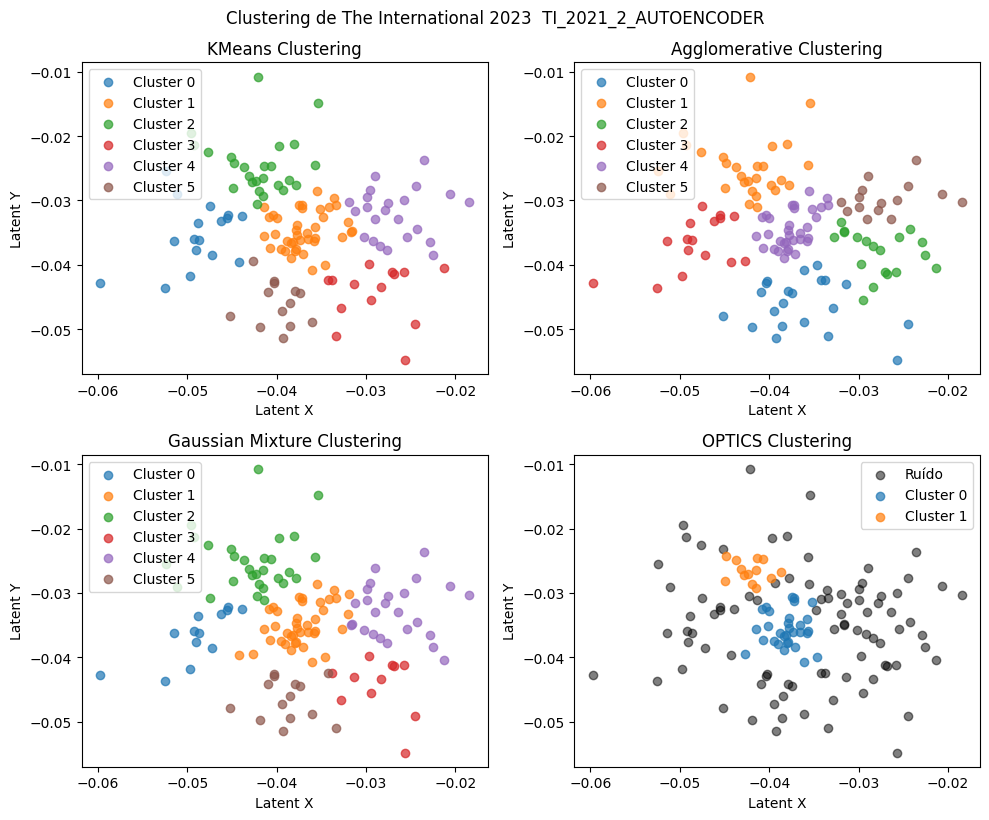

Cluster labels: [0 1 2 3 4 5]
Agglomerative labels: [0 1 2 3 4 5]
GMM labels: [0 1 2 3 4 5]
OPTICS labels: [-1  0  1]
Algoritmo: kmeans
  Cluster 0: 17 partidas
  Cluster 1: 40 partidas
  Cluster 2: 25 partidas
  Cluster 3: 14 partidas
  Cluster 4: 23 partidas
  Cluster 5: 13 partidas
Algoritmo: agglomerative
  Cluster 0: 21 partidas
  Cluster 1: 28 partidas
  Cluster 2: 19 partidas
  Cluster 3: 16 partidas
  Cluster 4: 33 partidas
  Cluster 5: 15 partidas
Algoritmo: gmm
  Cluster 0: 13 partidas
  Cluster 1: 40 partidas
  Cluster 2: 29 partidas
  Cluster 3: 11 partidas
  Cluster 4: 25 partidas
  Cluster 5: 14 partidas
Algoritmo: optics
  Cluster -1: 88 partidas
  Cluster 0: 31 partidas
  Cluster 1: 13 partidas
Processing 195 matches from The International 2022
Autoencoder name: ti_2021_2_autoencoder


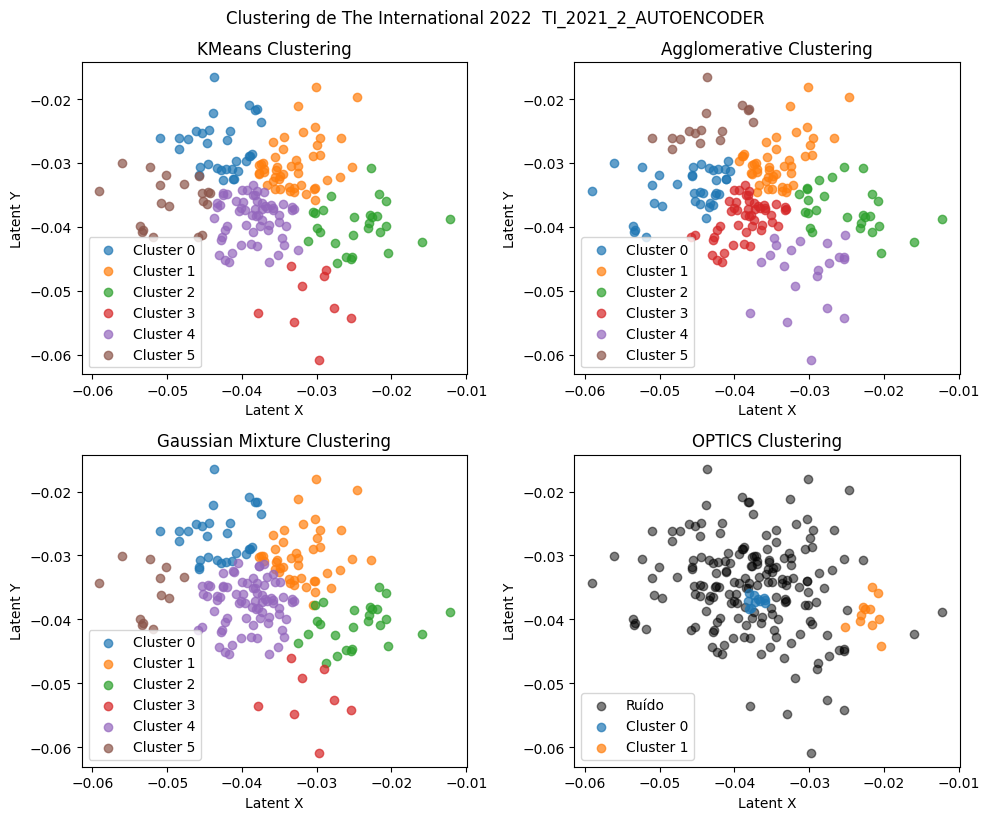

Cluster labels: [0 1 2 3 4 5]
Agglomerative labels: [0 1 2 3 4 5]
GMM labels: [0 1 2 3 4 5]
OPTICS labels: [-1  0  1]
Algoritmo: kmeans
  Cluster 0: 32 partidas
  Cluster 1: 47 partidas
  Cluster 2: 27 partidas
  Cluster 3: 9 partidas
  Cluster 4: 60 partidas
  Cluster 5: 20 partidas
Algoritmo: agglomerative
  Cluster 0: 37 partidas
  Cluster 1: 45 partidas
  Cluster 2: 27 partidas
  Cluster 3: 49 partidas
  Cluster 4: 21 partidas
  Cluster 5: 16 partidas
Algoritmo: gmm
  Cluster 0: 29 partidas
  Cluster 1: 43 partidas
  Cluster 2: 26 partidas
  Cluster 3: 8 partidas
  Cluster 4: 77 partidas
  Cluster 5: 12 partidas
Algoritmo: optics
  Cluster -1: 173 partidas
  Cluster 0: 11 partidas
  Cluster 1: 11 partidas
Processing 758 matches from The International 2021
Autoencoder name: ti_2021_2_autoencoder


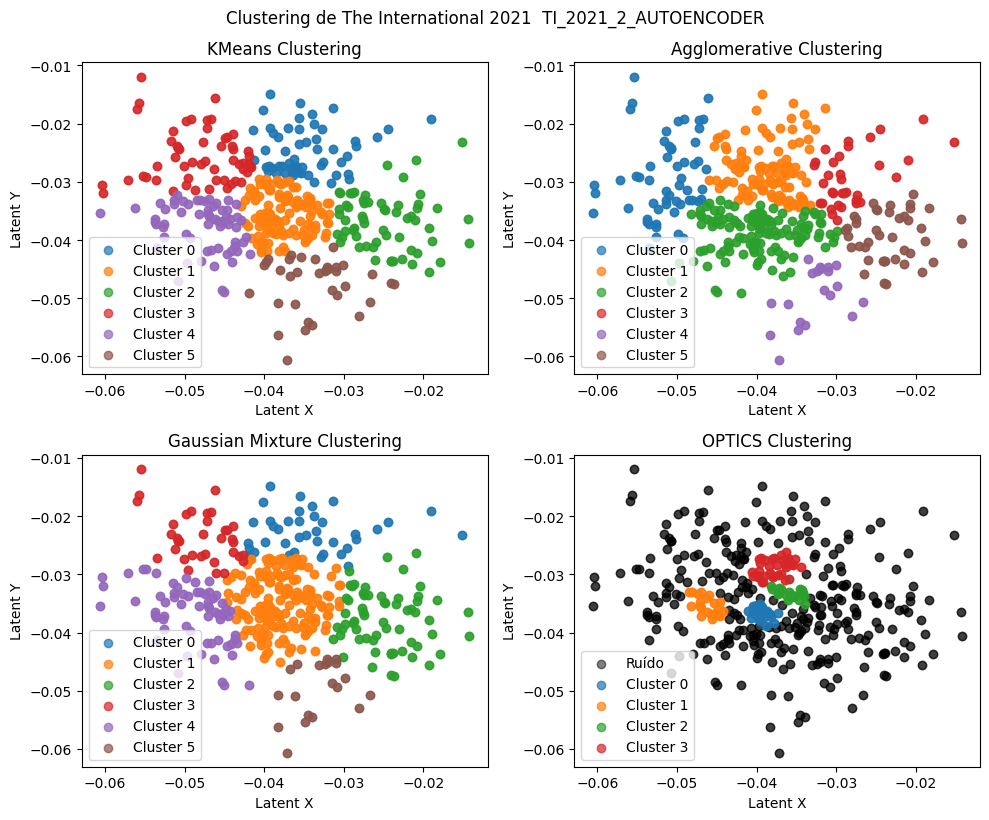

Cluster labels: [0 1 2 3 4 5]
Agglomerative labels: [0 1 2 3 4 5]
GMM labels: [0 1 2 3 4 5]
OPTICS labels: [-1  0  1  2  3]
Algoritmo: kmeans
  Cluster 0: 110 partidas
  Cluster 1: 220 partidas
  Cluster 2: 122 partidas
  Cluster 3: 110 partidas
  Cluster 4: 128 partidas
  Cluster 5: 68 partidas
Algoritmo: agglomerative
  Cluster 0: 112 partidas
  Cluster 1: 210 partidas
  Cluster 2: 244 partidas
  Cluster 3: 68 partidas
  Cluster 4: 40 partidas
  Cluster 5: 84 partidas
Algoritmo: gmm
  Cluster 0: 78 partidas
  Cluster 1: 314 partidas
  Cluster 2: 124 partidas
  Cluster 3: 70 partidas
  Cluster 4: 132 partidas
  Cluster 5: 40 partidas
Algoritmo: optics
  Cluster -1: 565 partidas
  Cluster 0: 44 partidas
  Cluster 1: 42 partidas
  Cluster 2: 40 partidas
  Cluster 3: 67 partidas
Cluster de datasets usando 3 dimensões latentes:
Loading pre-trained model for TI 2024
Loading pre-trained model for TI 2023
Loading pre-trained model for TI 2022
Loading pre-trained model for TI 2021
Processing 

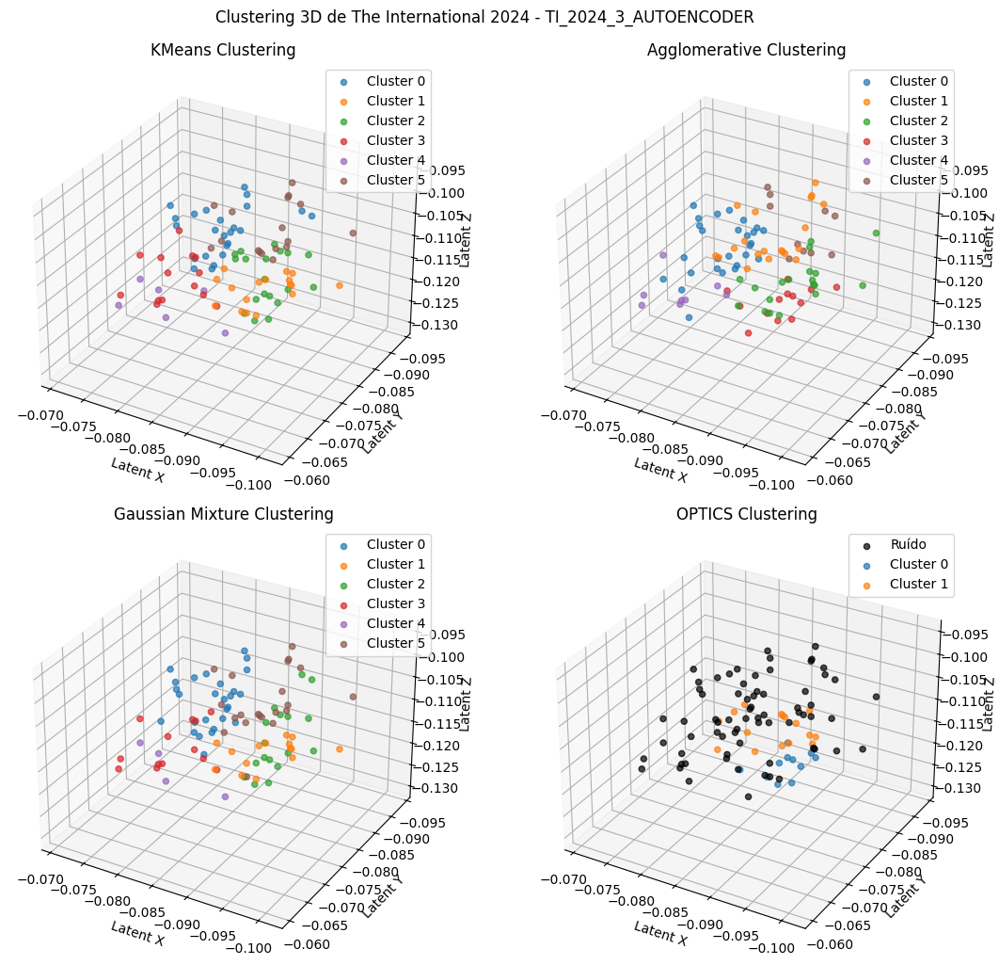

Cluster labels: [0 1 2 3 4 5]
Agglomerative labels: [0 1 2 3 4 5]
GMM labels: [0 1 2 3 4 5]
OPTICS labels: [-1  0  1]
Algoritmo: kmeans
  Cluster 0: 24 partidas
  Cluster 1: 17 partidas
  Cluster 2: 19 partidas
  Cluster 3: 14 partidas
  Cluster 4: 6 partidas
  Cluster 5: 17 partidas
Algoritmo: agglomerative
  Cluster 0: 27 partidas
  Cluster 1: 20 partidas
  Cluster 2: 19 partidas
  Cluster 3: 13 partidas
  Cluster 4: 8 partidas
  Cluster 5: 10 partidas
Algoritmo: gmm
  Cluster 0: 27 partidas
  Cluster 1: 15 partidas
  Cluster 2: 17 partidas
  Cluster 3: 13 partidas
  Cluster 4: 4 partidas
  Cluster 5: 21 partidas
Algoritmo: optics
  Cluster -1: 70 partidas
  Cluster 0: 11 partidas
  Cluster 1: 16 partidas
Processing 132 matches from The International 2023
Autoencoder name: ti_2024_3_autoencoder


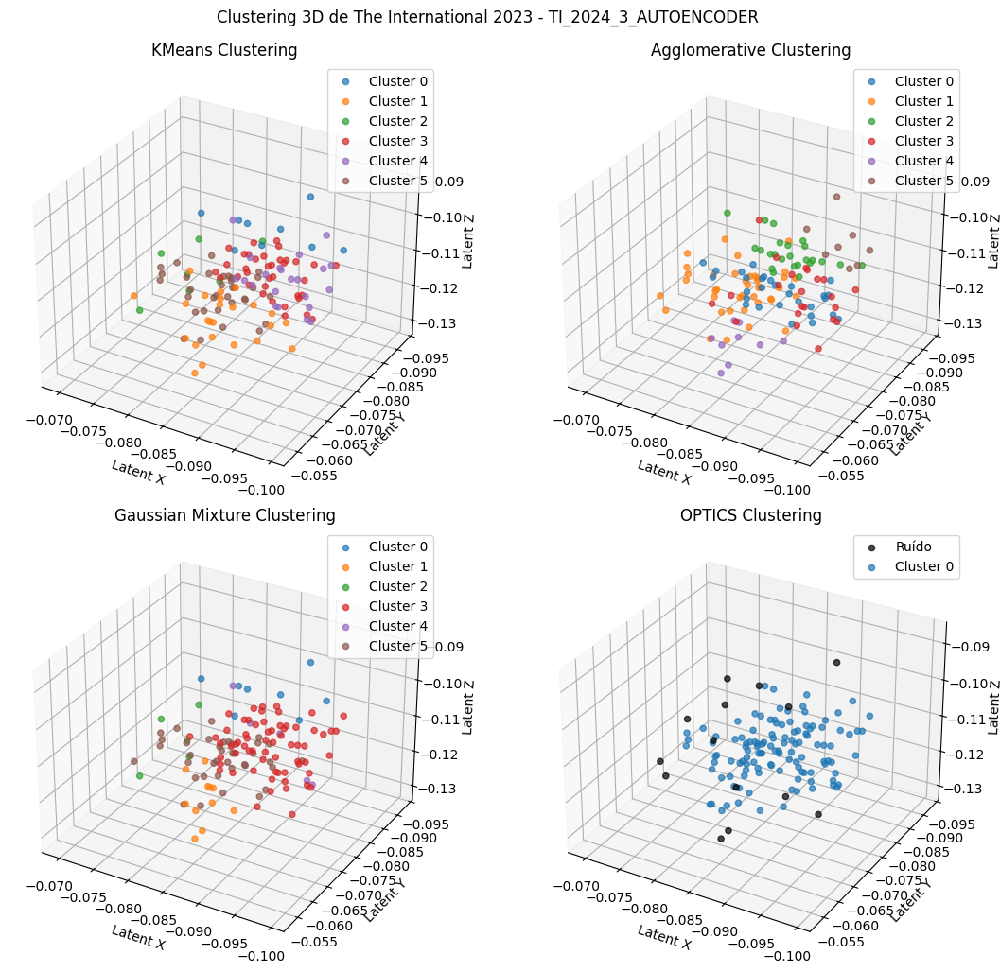

Cluster labels: [0 1 2 3 4 5]
Agglomerative labels: [0 1 2 3 4 5]
GMM labels: [0 1 2 3 4 5]
OPTICS labels: [-1  0]
Algoritmo: kmeans
  Cluster 0: 9 partidas
  Cluster 1: 24 partidas
  Cluster 2: 7 partidas
  Cluster 3: 36 partidas
  Cluster 4: 22 partidas
  Cluster 5: 34 partidas
Algoritmo: agglomerative
  Cluster 0: 29 partidas
  Cluster 1: 40 partidas
  Cluster 2: 24 partidas
  Cluster 3: 22 partidas
  Cluster 4: 9 partidas
  Cluster 5: 8 partidas
Algoritmo: gmm
  Cluster 0: 8 partidas
  Cluster 1: 11 partidas
  Cluster 2: 5 partidas
  Cluster 3: 65 partidas
  Cluster 4: 5 partidas
  Cluster 5: 38 partidas
Algoritmo: optics
  Cluster -1: 14 partidas
  Cluster 0: 118 partidas
Processing 195 matches from The International 2022
Autoencoder name: ti_2024_3_autoencoder


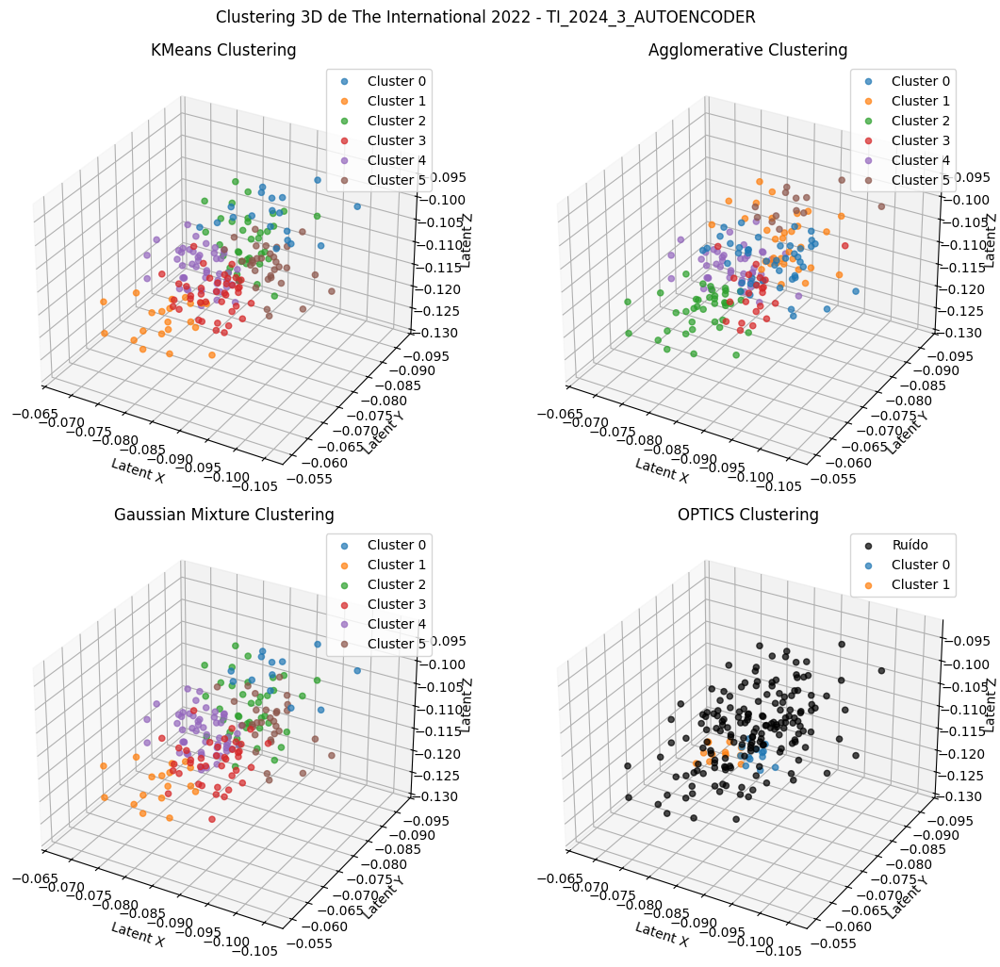

Cluster labels: [0 1 2 3 4 5]
Agglomerative labels: [0 1 2 3 4 5]
GMM labels: [0 1 2 3 4 5]
OPTICS labels: [-1  0  1]
Algoritmo: kmeans
  Cluster 0: 19 partidas
  Cluster 1: 21 partidas
  Cluster 2: 36 partidas
  Cluster 3: 40 partidas
  Cluster 4: 47 partidas
  Cluster 5: 32 partidas
Algoritmo: agglomerative
  Cluster 0: 45 partidas
  Cluster 1: 32 partidas
  Cluster 2: 39 partidas
  Cluster 3: 22 partidas
  Cluster 4: 44 partidas
  Cluster 5: 13 partidas
Algoritmo: gmm
  Cluster 0: 13 partidas
  Cluster 1: 17 partidas
  Cluster 2: 39 partidas
  Cluster 3: 40 partidas
  Cluster 4: 55 partidas
  Cluster 5: 31 partidas
Algoritmo: optics
  Cluster -1: 170 partidas
  Cluster 0: 13 partidas
  Cluster 1: 12 partidas
Processing 758 matches from The International 2021
Autoencoder name: ti_2024_3_autoencoder


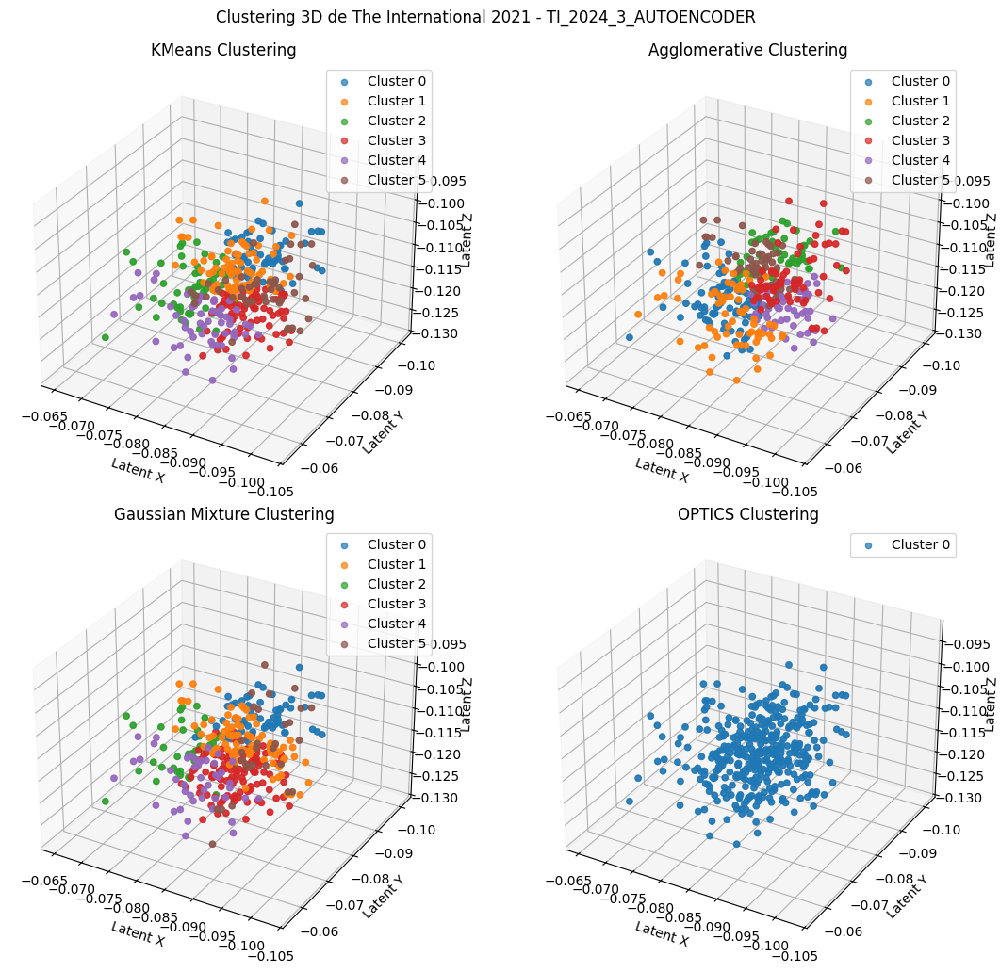

Cluster labels: [0 1 2 3 4 5]
Agglomerative labels: [0 1 2 3 4 5]
GMM labels: [0 1 2 3 4 5]
OPTICS labels: [0]
Algoritmo: kmeans
  Cluster 0: 106 partidas
  Cluster 1: 168 partidas
  Cluster 2: 114 partidas
  Cluster 3: 160 partidas
  Cluster 4: 118 partidas
  Cluster 5: 92 partidas
Algoritmo: agglomerative
  Cluster 0: 164 partidas
  Cluster 1: 132 partidas
  Cluster 2: 94 partidas
  Cluster 3: 140 partidas
  Cluster 4: 112 partidas
  Cluster 5: 116 partidas
Algoritmo: gmm
  Cluster 0: 114 partidas
  Cluster 1: 184 partidas
  Cluster 2: 74 partidas
  Cluster 3: 238 partidas
  Cluster 4: 90 partidas
  Cluster 5: 58 partidas
Algoritmo: optics
  Cluster 0: 758 partidas
Processing 97 matches from The International 2024
Autoencoder name: ti_2023_3_autoencoder


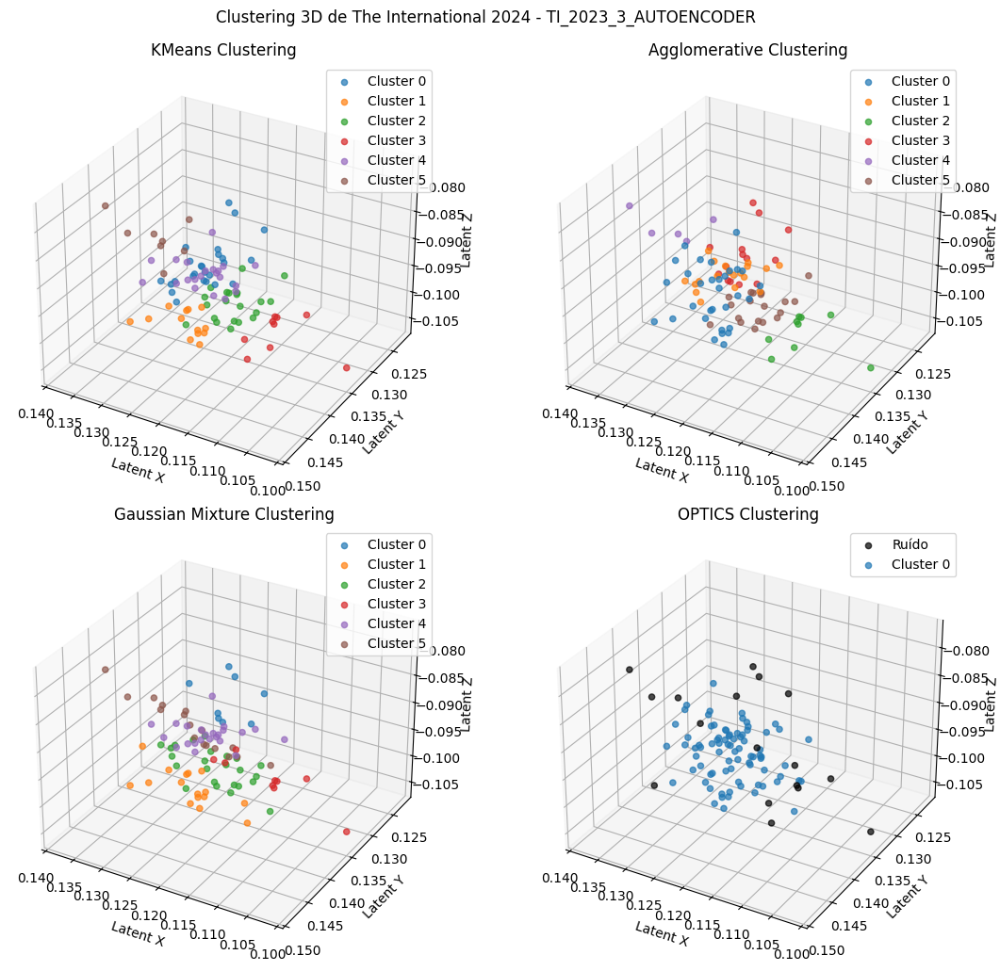

Cluster labels: [0 1 2 3 4 5]
Agglomerative labels: [0 1 2 3 4 5]
GMM labels: [0 1 2 3 4 5]
OPTICS labels: [-1  0]
Algoritmo: kmeans
  Cluster 0: 25 partidas
  Cluster 1: 13 partidas
  Cluster 2: 21 partidas
  Cluster 3: 9 partidas
  Cluster 4: 21 partidas
  Cluster 5: 8 partidas
Algoritmo: agglomerative
  Cluster 0: 31 partidas
  Cluster 1: 19 partidas
  Cluster 2: 9 partidas
  Cluster 3: 14 partidas
  Cluster 4: 5 partidas
  Cluster 5: 19 partidas
Algoritmo: gmm
  Cluster 0: 8 partidas
  Cluster 1: 16 partidas
  Cluster 2: 24 partidas
  Cluster 3: 9 partidas
  Cluster 4: 23 partidas
  Cluster 5: 17 partidas
Algoritmo: optics
  Cluster -1: 17 partidas
  Cluster 0: 80 partidas
Processing 132 matches from The International 2023
Autoencoder name: ti_2023_3_autoencoder


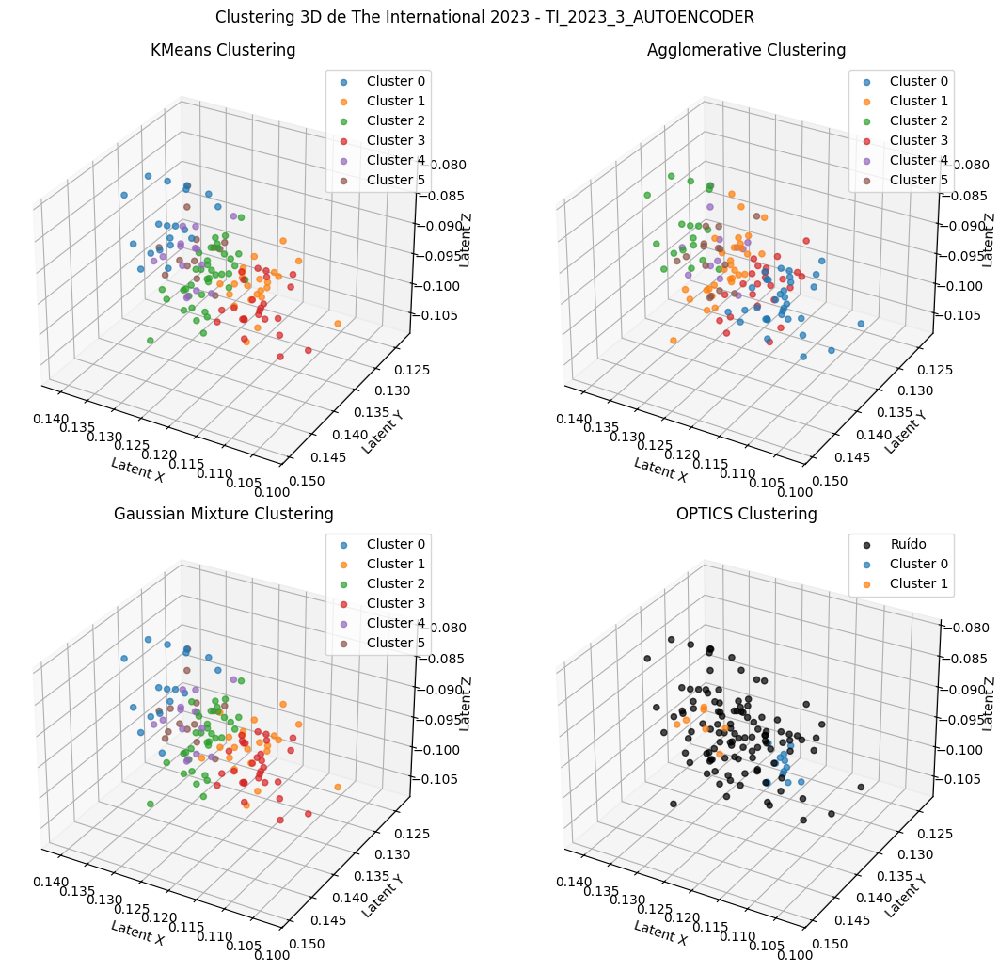

Cluster labels: [0 1 2 3 4 5]
Agglomerative labels: [0 1 2 3 4 5]
GMM labels: [0 1 2 3 4 5]
OPTICS labels: [-1  0  1]
Algoritmo: kmeans
  Cluster 0: 19 partidas
  Cluster 1: 23 partidas
  Cluster 2: 38 partidas
  Cluster 3: 24 partidas
  Cluster 4: 15 partidas
  Cluster 5: 13 partidas
Algoritmo: agglomerative
  Cluster 0: 33 partidas
  Cluster 1: 30 partidas
  Cluster 2: 18 partidas
  Cluster 3: 24 partidas
  Cluster 4: 12 partidas
  Cluster 5: 15 partidas
Algoritmo: gmm
  Cluster 0: 17 partidas
  Cluster 1: 22 partidas
  Cluster 2: 35 partidas
  Cluster 3: 30 partidas
  Cluster 4: 14 partidas
  Cluster 5: 14 partidas
Algoritmo: optics
  Cluster -1: 112 partidas
  Cluster 0: 13 partidas
  Cluster 1: 7 partidas
Processing 195 matches from The International 2022
Autoencoder name: ti_2023_3_autoencoder


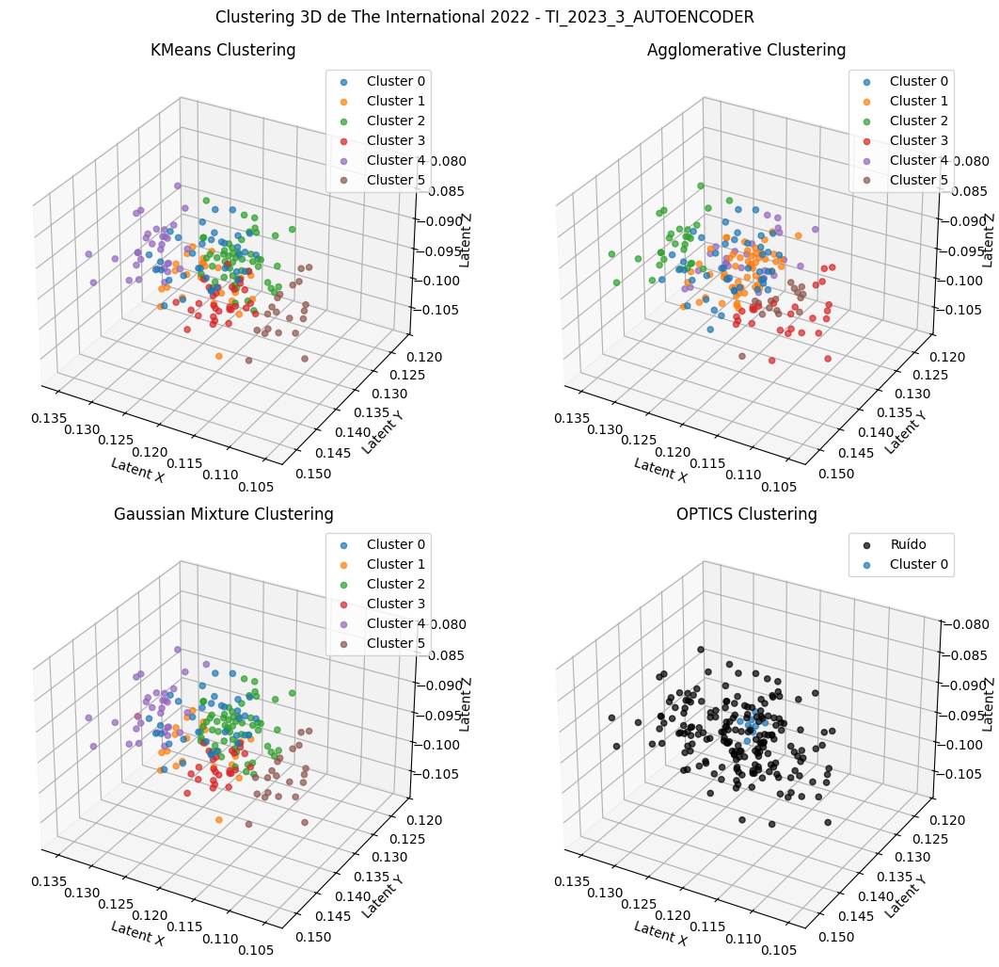

Cluster labels: [0 1 2 3 4 5]
Agglomerative labels: [0 1 2 3 4 5]
GMM labels: [0 1 2 3 4 5]
OPTICS labels: [-1  0]
Algoritmo: kmeans
  Cluster 0: 35 partidas
  Cluster 1: 26 partidas
  Cluster 2: 51 partidas
  Cluster 3: 31 partidas
  Cluster 4: 32 partidas
  Cluster 5: 20 partidas
Algoritmo: agglomerative
  Cluster 0: 44 partidas
  Cluster 1: 54 partidas
  Cluster 2: 29 partidas
  Cluster 3: 27 partidas
  Cluster 4: 25 partidas
  Cluster 5: 16 partidas
Algoritmo: gmm
  Cluster 0: 35 partidas
  Cluster 1: 22 partidas
  Cluster 2: 60 partidas
  Cluster 3: 25 partidas
  Cluster 4: 32 partidas
  Cluster 5: 21 partidas
Algoritmo: optics
  Cluster -1: 186 partidas
  Cluster 0: 9 partidas
Processing 758 matches from The International 2021
Autoencoder name: ti_2023_3_autoencoder


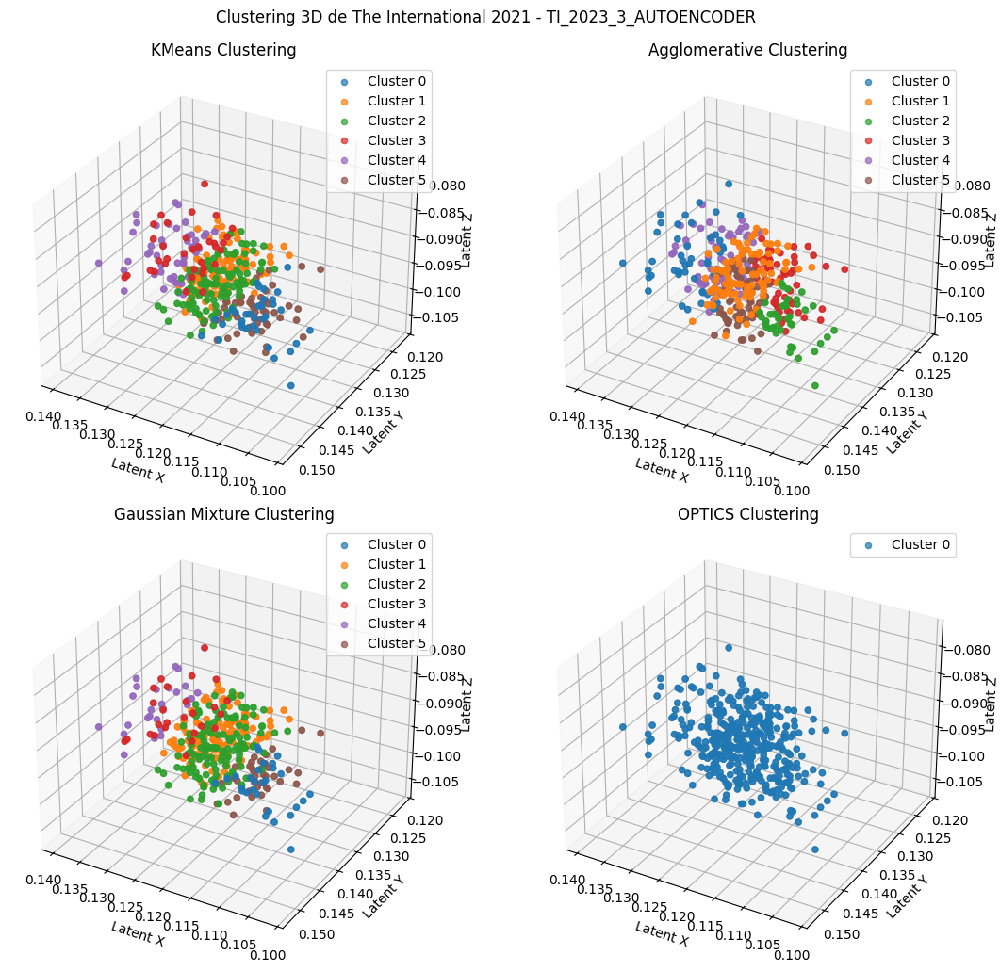

Cluster labels: [0 1 2 3 4 5]
Agglomerative labels: [0 1 2 3 4 5]
GMM labels: [0 1 2 3 4 5]
OPTICS labels: [0]
Algoritmo: kmeans
  Cluster 0: 70 partidas
  Cluster 1: 204 partidas
  Cluster 2: 214 partidas
  Cluster 3: 68 partidas
  Cluster 4: 94 partidas
  Cluster 5: 108 partidas
Algoritmo: agglomerative
  Cluster 0: 92 partidas
  Cluster 1: 192 partidas
  Cluster 2: 82 partidas
  Cluster 3: 114 partidas
  Cluster 4: 148 partidas
  Cluster 5: 130 partidas
Algoritmo: gmm
  Cluster 0: 56 partidas
  Cluster 1: 246 partidas
  Cluster 2: 272 partidas
  Cluster 3: 52 partidas
  Cluster 4: 52 partidas
  Cluster 5: 80 partidas
Algoritmo: optics
  Cluster 0: 758 partidas
Processing 97 matches from The International 2024
Autoencoder name: ti_2022_3_autoencoder


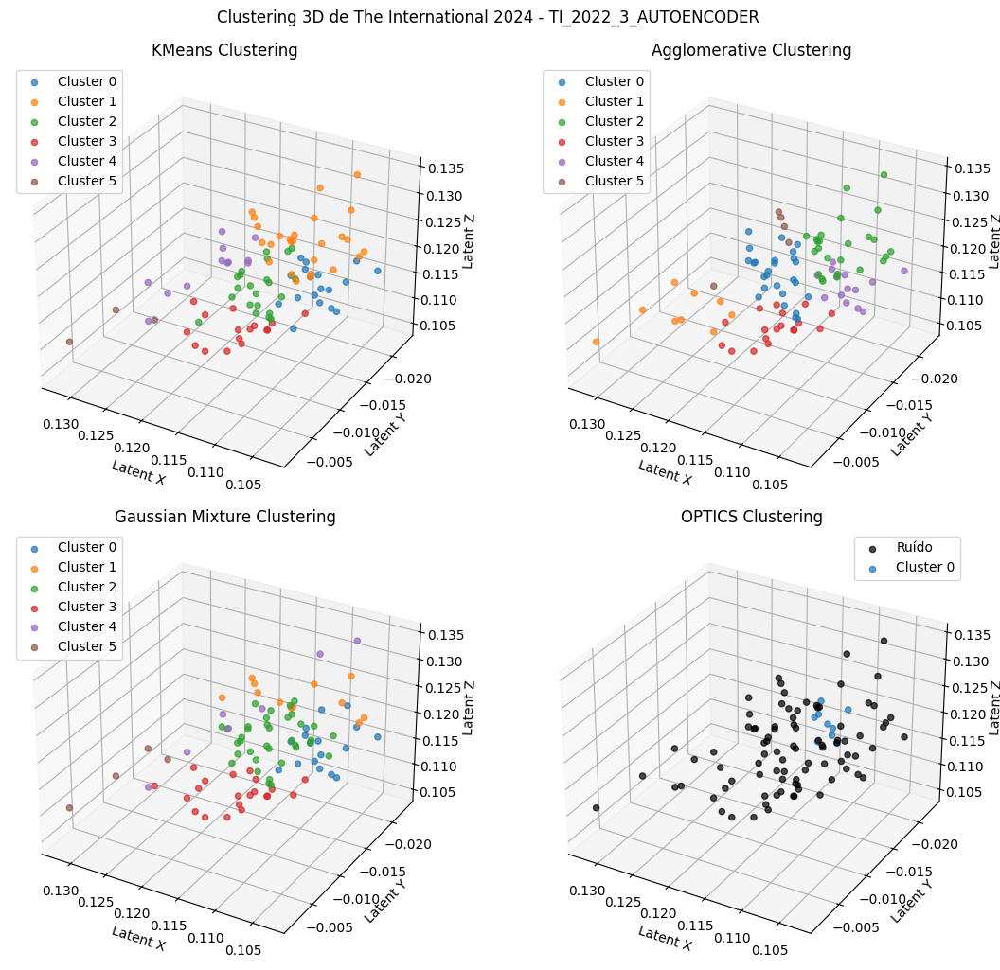

Cluster labels: [0 1 2 3 4 5]
Agglomerative labels: [0 1 2 3 4 5]
GMM labels: [0 1 2 3 4 5]
OPTICS labels: [-1  0]
Algoritmo: kmeans
  Cluster 0: 18 partidas
  Cluster 1: 26 partidas
  Cluster 2: 22 partidas
  Cluster 3: 16 partidas
  Cluster 4: 12 partidas
  Cluster 5: 3 partidas
Algoritmo: agglomerative
  Cluster 0: 26 partidas
  Cluster 1: 9 partidas
  Cluster 2: 25 partidas
  Cluster 3: 18 partidas
  Cluster 4: 14 partidas
  Cluster 5: 5 partidas
Algoritmo: gmm
  Cluster 0: 17 partidas
  Cluster 1: 12 partidas
  Cluster 2: 36 partidas
  Cluster 3: 21 partidas
  Cluster 4: 7 partidas
  Cluster 5: 4 partidas
Algoritmo: optics
  Cluster -1: 88 partidas
  Cluster 0: 9 partidas
Processing 132 matches from The International 2023
Autoencoder name: ti_2022_3_autoencoder


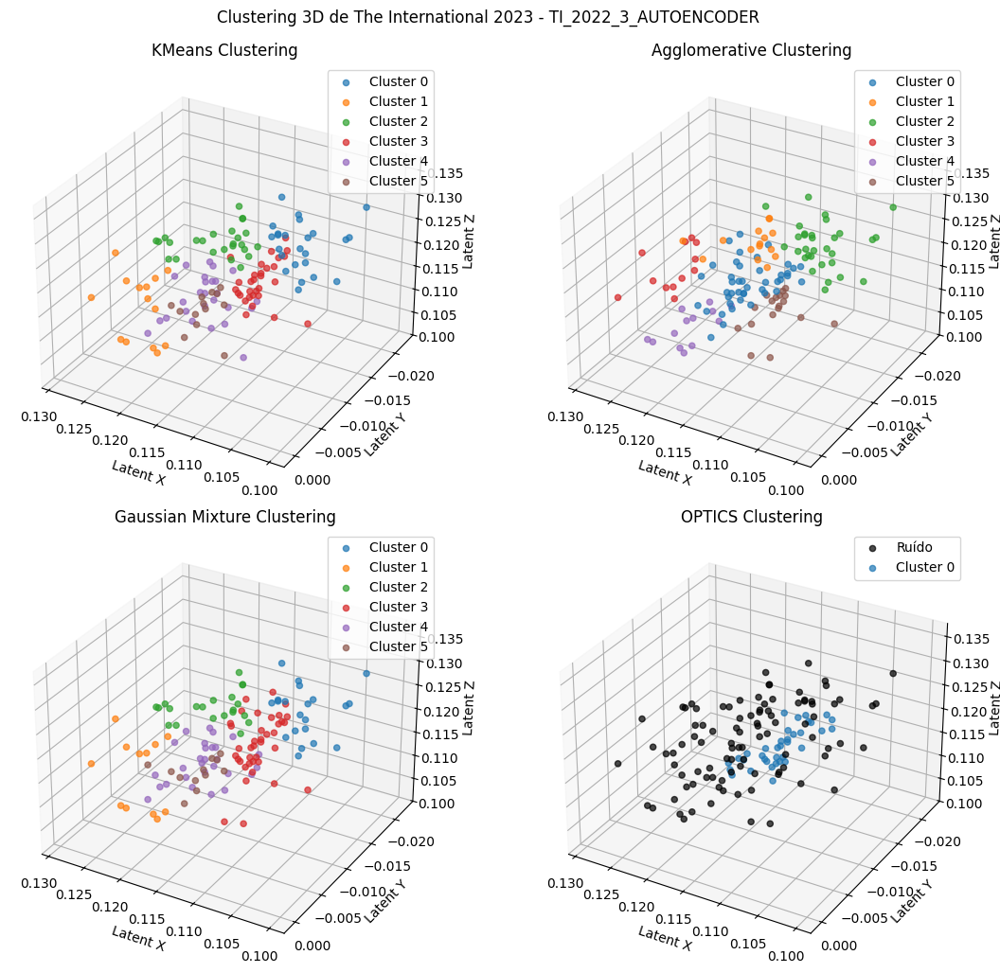

Cluster labels: [0 1 2 3 4 5]
Agglomerative labels: [0 1 2 3 4 5]
GMM labels: [0 1 2 3 4 5]
OPTICS labels: [-1  0]
Algoritmo: kmeans
  Cluster 0: 24 partidas
  Cluster 1: 14 partidas
  Cluster 2: 25 partidas
  Cluster 3: 30 partidas
  Cluster 4: 26 partidas
  Cluster 5: 13 partidas
Algoritmo: agglomerative
  Cluster 0: 43 partidas
  Cluster 1: 15 partidas
  Cluster 2: 31 partidas
  Cluster 3: 12 partidas
  Cluster 4: 13 partidas
  Cluster 5: 18 partidas
Algoritmo: gmm
  Cluster 0: 21 partidas
  Cluster 1: 12 partidas
  Cluster 2: 21 partidas
  Cluster 3: 38 partidas
  Cluster 4: 28 partidas
  Cluster 5: 12 partidas
Algoritmo: optics
  Cluster -1: 96 partidas
  Cluster 0: 36 partidas
Processing 195 matches from The International 2022
Autoencoder name: ti_2022_3_autoencoder


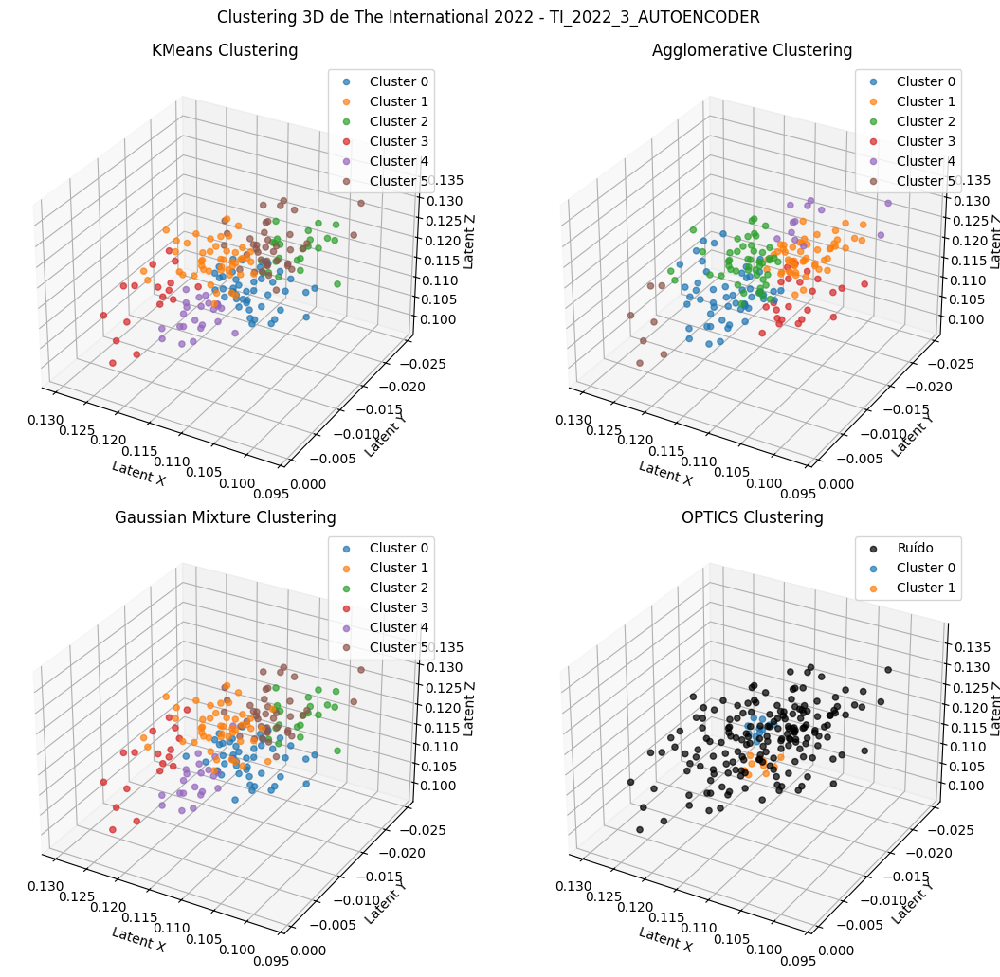

Cluster labels: [0 1 2 3 4 5]
Agglomerative labels: [0 1 2 3 4 5]
GMM labels: [0 1 2 3 4 5]
OPTICS labels: [-1  0  1]
Algoritmo: kmeans
  Cluster 0: 44 partidas
  Cluster 1: 47 partidas
  Cluster 2: 24 partidas
  Cluster 3: 17 partidas
  Cluster 4: 24 partidas
  Cluster 5: 39 partidas
Algoritmo: agglomerative
  Cluster 0: 53 partidas
  Cluster 1: 51 partidas
  Cluster 2: 48 partidas
  Cluster 3: 24 partidas
  Cluster 4: 12 partidas
  Cluster 5: 7 partidas
Algoritmo: gmm
  Cluster 0: 47 partidas
  Cluster 1: 47 partidas
  Cluster 2: 21 partidas
  Cluster 3: 18 partidas
  Cluster 4: 22 partidas
  Cluster 5: 40 partidas
Algoritmo: optics
  Cluster -1: 173 partidas
  Cluster 0: 11 partidas
  Cluster 1: 11 partidas
Processing 758 matches from The International 2021
Autoencoder name: ti_2022_3_autoencoder


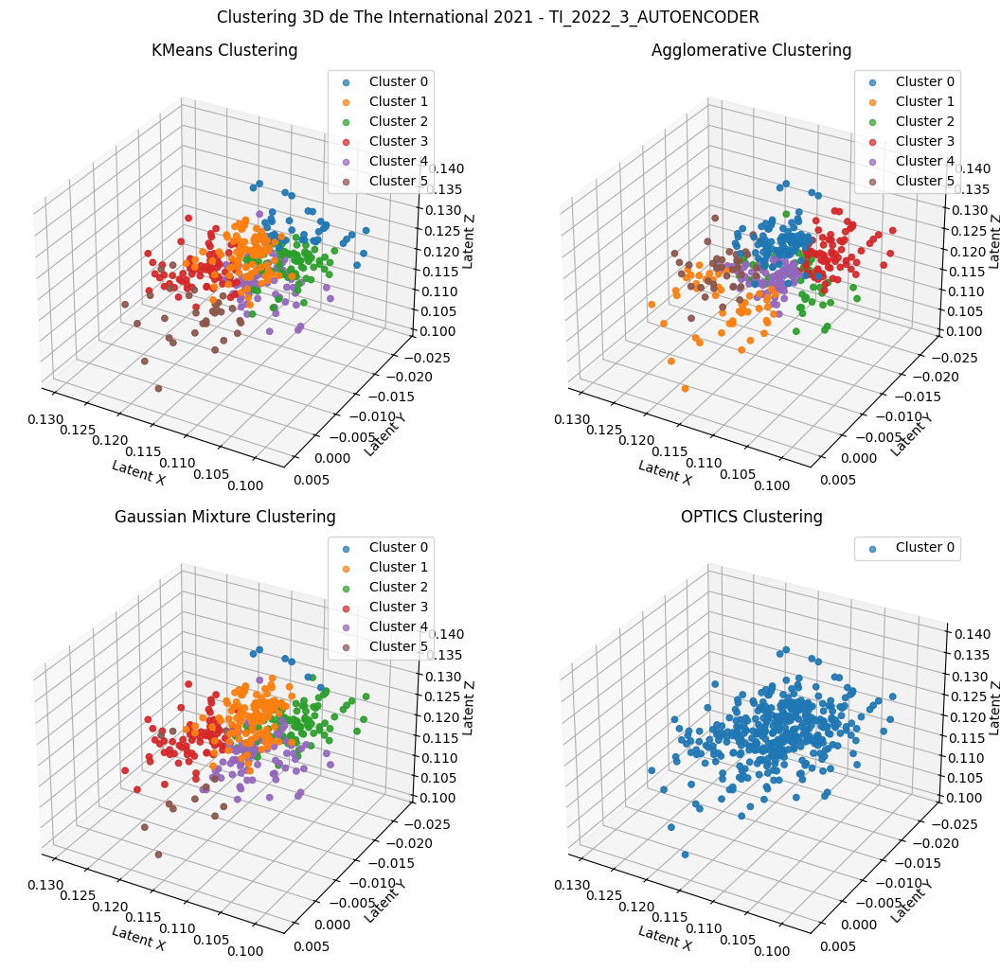

Cluster labels: [0 1 2 3 4 5]
Agglomerative labels: [0 1 2 3 4 5]
GMM labels: [0 1 2 3 4 5]
OPTICS labels: [0]
Algoritmo: kmeans
  Cluster 0: 80 partidas
  Cluster 1: 180 partidas
  Cluster 2: 148 partidas
  Cluster 3: 136 partidas
  Cluster 4: 152 partidas
  Cluster 5: 62 partidas
Algoritmo: agglomerative
  Cluster 0: 178 partidas
  Cluster 1: 96 partidas
  Cluster 2: 110 partidas
  Cluster 3: 146 partidas
  Cluster 4: 156 partidas
  Cluster 5: 72 partidas
Algoritmo: gmm
  Cluster 0: 12 partidas
  Cluster 1: 232 partidas
  Cluster 2: 190 partidas
  Cluster 3: 144 partidas
  Cluster 4: 156 partidas
  Cluster 5: 24 partidas
Algoritmo: optics
  Cluster 0: 758 partidas
Processing 97 matches from The International 2024
Autoencoder name: ti_2021_3_autoencoder


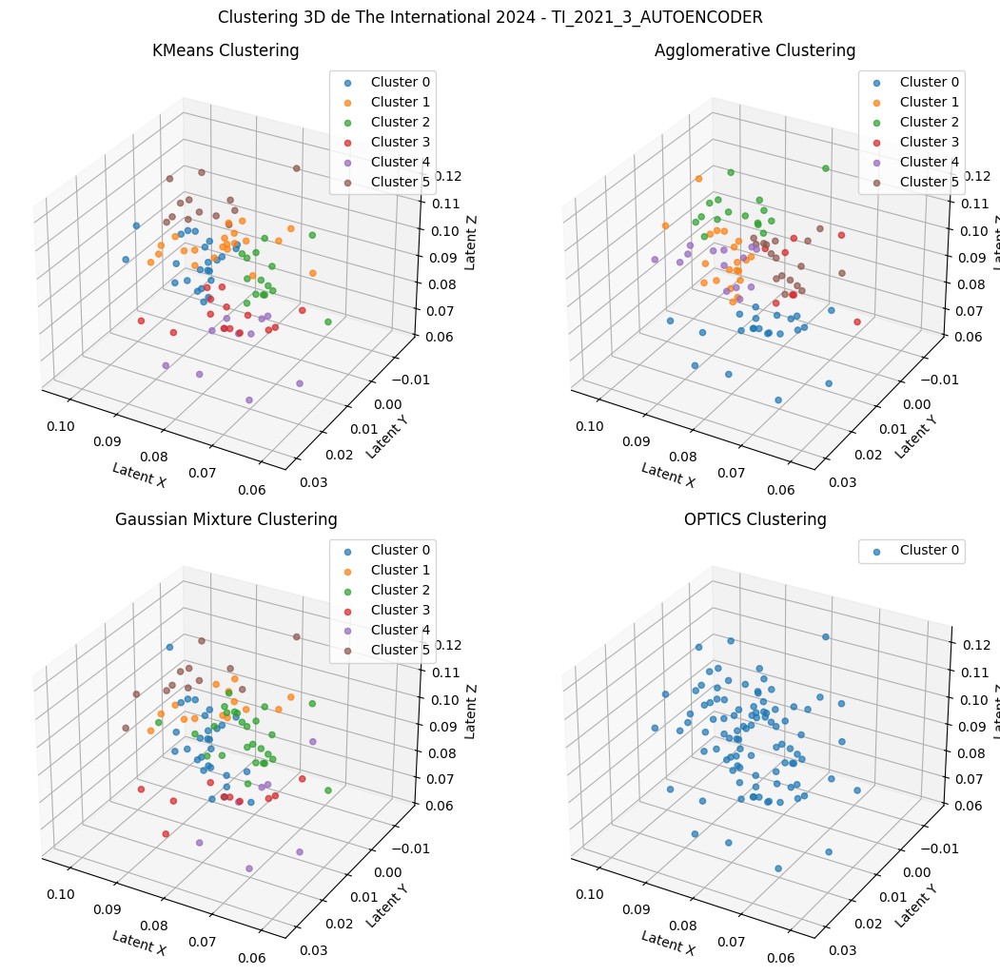

Cluster labels: [0 1 2 3 4 5]
Agglomerative labels: [0 1 2 3 4 5]
GMM labels: [0 1 2 3 4 5]
OPTICS labels: [0]
Algoritmo: kmeans
  Cluster 0: 23 partidas
  Cluster 1: 21 partidas
  Cluster 2: 15 partidas
  Cluster 3: 14 partidas
  Cluster 4: 11 partidas
  Cluster 5: 13 partidas
Algoritmo: agglomerative
  Cluster 0: 22 partidas
  Cluster 1: 20 partidas
  Cluster 2: 16 partidas
  Cluster 3: 8 partidas
  Cluster 4: 14 partidas
  Cluster 5: 17 partidas
Algoritmo: gmm
  Cluster 0: 28 partidas
  Cluster 1: 14 partidas
  Cluster 2: 26 partidas
  Cluster 3: 10 partidas
  Cluster 4: 7 partidas
  Cluster 5: 12 partidas
Algoritmo: optics
  Cluster 0: 97 partidas
Processing 132 matches from The International 2023
Autoencoder name: ti_2021_3_autoencoder


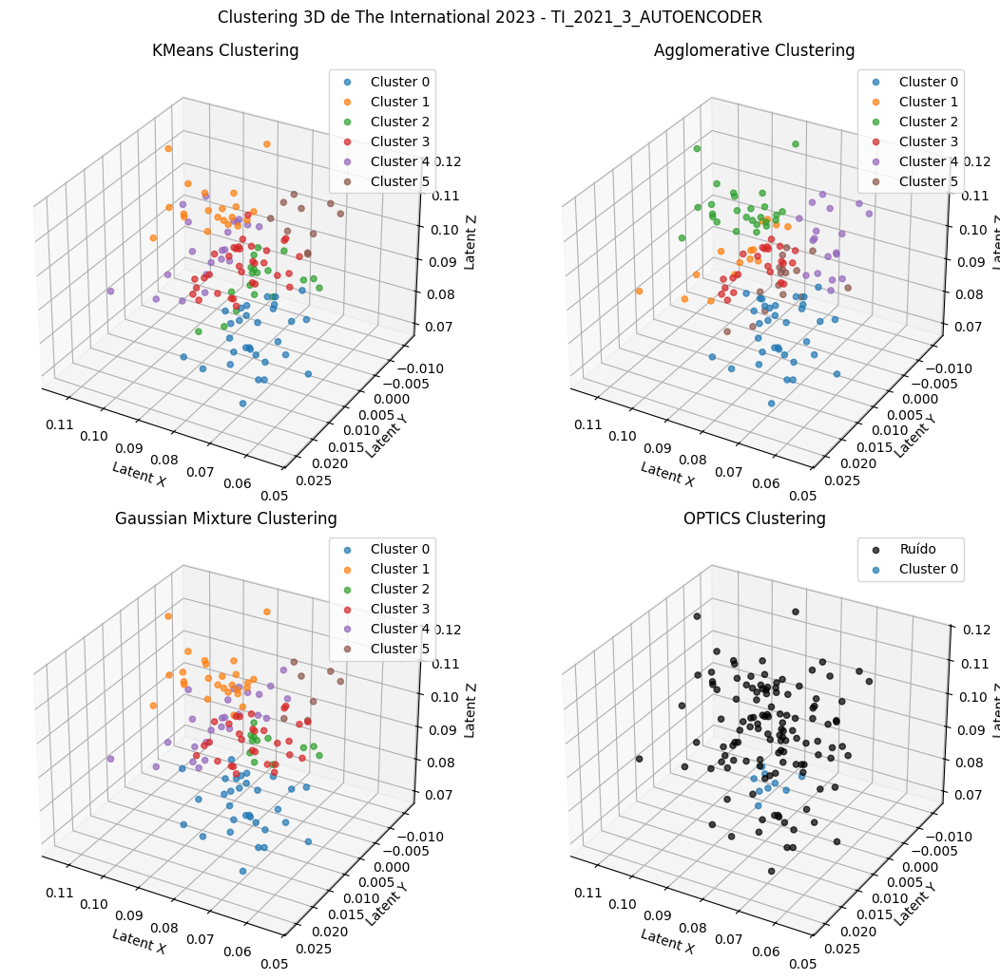

Cluster labels: [0 1 2 3 4 5]
Agglomerative labels: [0 1 2 3 4 5]
GMM labels: [0 1 2 3 4 5]
OPTICS labels: [-1  0]
Algoritmo: kmeans
  Cluster 0: 30 partidas
  Cluster 1: 20 partidas
  Cluster 2: 18 partidas
  Cluster 3: 33 partidas
  Cluster 4: 21 partidas
  Cluster 5: 10 partidas
Algoritmo: agglomerative
  Cluster 0: 34 partidas
  Cluster 1: 15 partidas
  Cluster 2: 26 partidas
  Cluster 3: 23 partidas
  Cluster 4: 18 partidas
  Cluster 5: 16 partidas
Algoritmo: gmm
  Cluster 0: 31 partidas
  Cluster 1: 26 partidas
  Cluster 2: 12 partidas
  Cluster 3: 30 partidas
  Cluster 4: 26 partidas
  Cluster 5: 7 partidas
Algoritmo: optics
  Cluster -1: 123 partidas
  Cluster 0: 9 partidas
Processing 195 matches from The International 2022
Autoencoder name: ti_2021_3_autoencoder


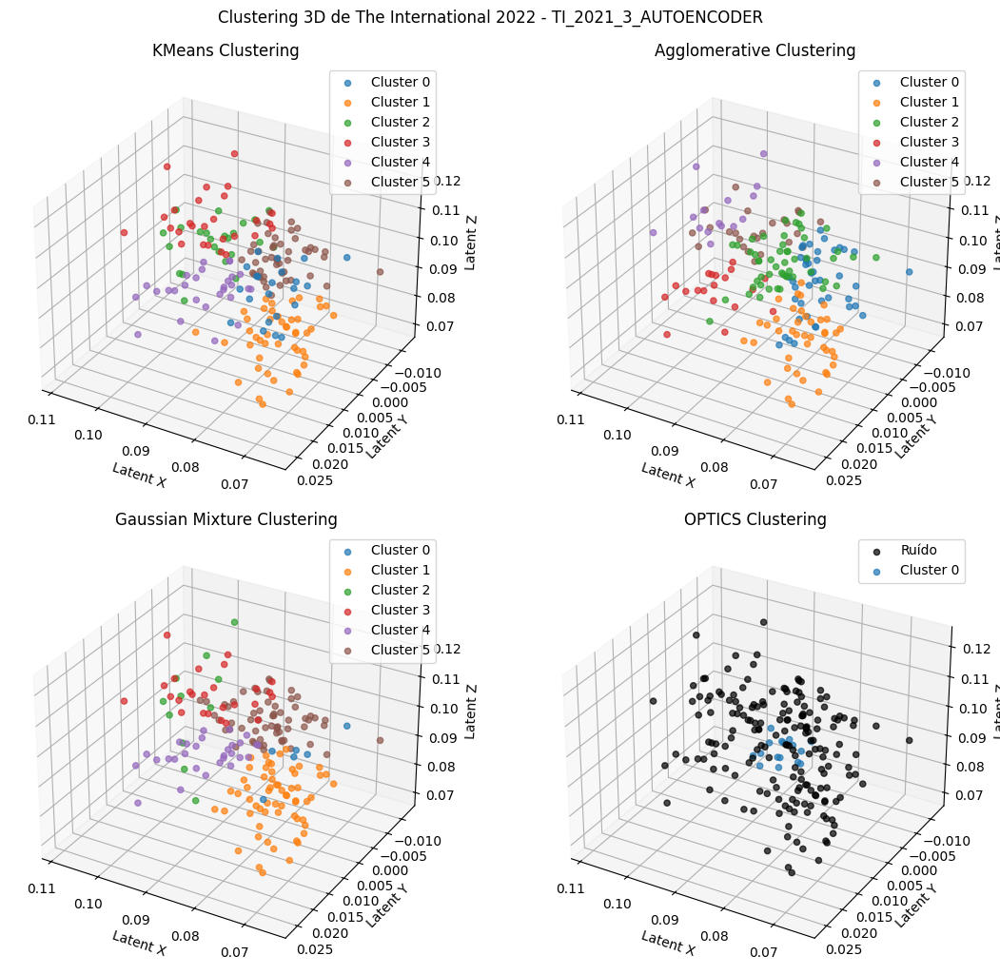

Cluster labels: [0 1 2 3 4 5]
Agglomerative labels: [0 1 2 3 4 5]
GMM labels: [0 1 2 3 4 5]
OPTICS labels: [-1  0]
Algoritmo: kmeans
  Cluster 0: 22 partidas
  Cluster 1: 47 partidas
  Cluster 2: 24 partidas
  Cluster 3: 27 partidas
  Cluster 4: 28 partidas
  Cluster 5: 47 partidas
Algoritmo: agglomerative
  Cluster 0: 43 partidas
  Cluster 1: 42 partidas
  Cluster 2: 51 partidas
  Cluster 3: 19 partidas
  Cluster 4: 15 partidas
  Cluster 5: 25 partidas
Algoritmo: gmm
  Cluster 0: 6 partidas
  Cluster 1: 61 partidas
  Cluster 2: 11 partidas
  Cluster 3: 26 partidas
  Cluster 4: 29 partidas
  Cluster 5: 62 partidas
Algoritmo: optics
  Cluster -1: 179 partidas
  Cluster 0: 16 partidas
Processing 758 matches from The International 2021
Autoencoder name: ti_2021_3_autoencoder


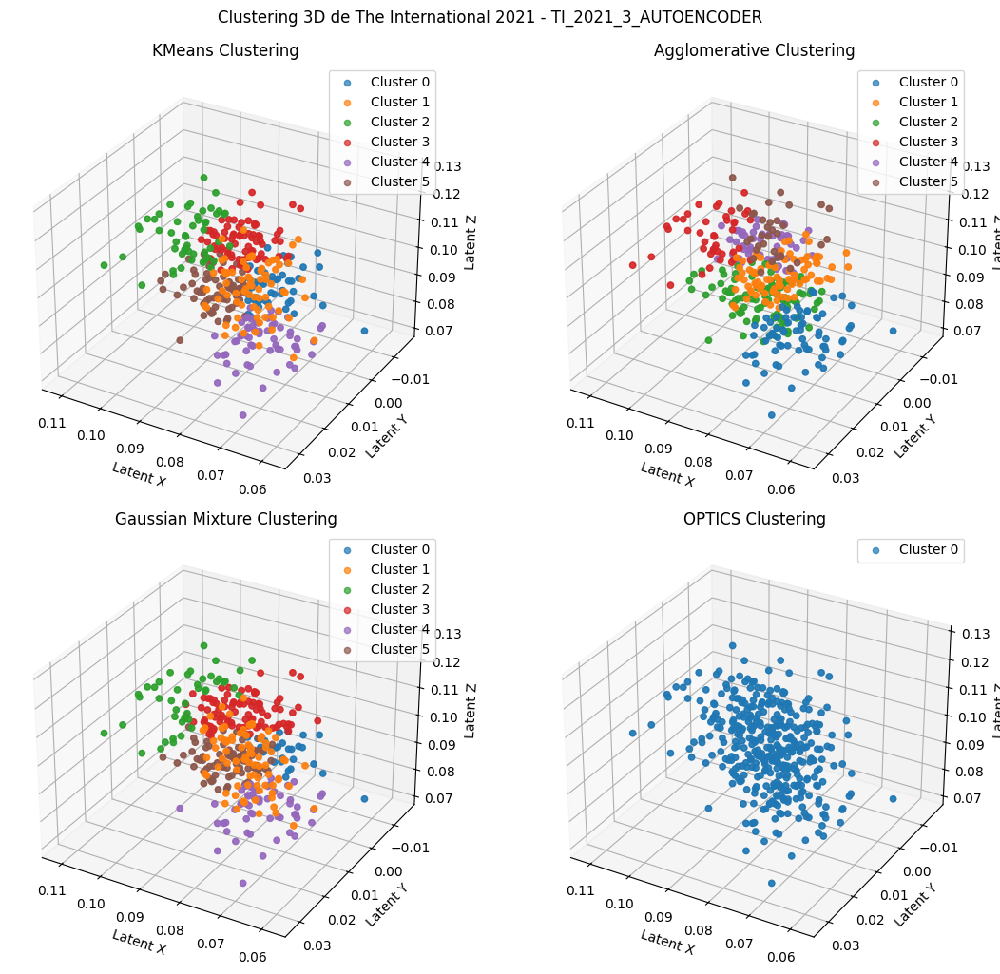

Cluster labels: [0 1 2 3 4 5]
Agglomerative labels: [0 1 2 3 4 5]
GMM labels: [0 1 2 3 4 5]
OPTICS labels: [0]
Algoritmo: kmeans
  Cluster 0: 106 partidas
  Cluster 1: 148 partidas
  Cluster 2: 102 partidas
  Cluster 3: 148 partidas
  Cluster 4: 122 partidas
  Cluster 5: 132 partidas
Algoritmo: agglomerative
  Cluster 0: 142 partidas
  Cluster 1: 166 partidas
  Cluster 2: 190 partidas
  Cluster 3: 84 partidas
  Cluster 4: 108 partidas
  Cluster 5: 68 partidas
Algoritmo: gmm
  Cluster 0: 60 partidas
  Cluster 1: 162 partidas
  Cluster 2: 88 partidas
  Cluster 3: 182 partidas
  Cluster 4: 112 partidas
  Cluster 5: 154 partidas
Algoritmo: optics
  Cluster 0: 758 partidas
Cluster de datasets usando 4 dimensões latentes:
Loading pre-trained model for TI 2024
Loading pre-trained model for TI 2023
Loading pre-trained model for TI 2022
Loading pre-trained model for TI 2021
Processing 97 matches from The International 2024
Autoencoder name: ti_2024_4_autoencoder
Cluster labels: [0 1 2 3 4 5]
Ag

In [20]:
print("Cluster de datasets usando 2 dimensões latentes:")
cluster(datasets, internationals, hero_cols, player_cols, latent_dim=2, n_clusters=6)
print("Cluster de datasets usando 3 dimensões latentes:")
cluster(datasets, internationals, hero_cols, player_cols, latent_dim=3, n_clusters=6)
print("Cluster de datasets usando 4 dimensões latentes:")
cluster(datasets, internationals, hero_cols, player_cols, latent_dim=4, n_clusters=6)
print("Cluster de datasets usando 48 dimensões latentes:")
cluster(datasets, internationals, hero_cols, player_cols, latent_dim=8, n_clusters=6)